In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 94.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (94.0 percentile): 5.19
Number of outliers (|value| > 15.57): 181
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


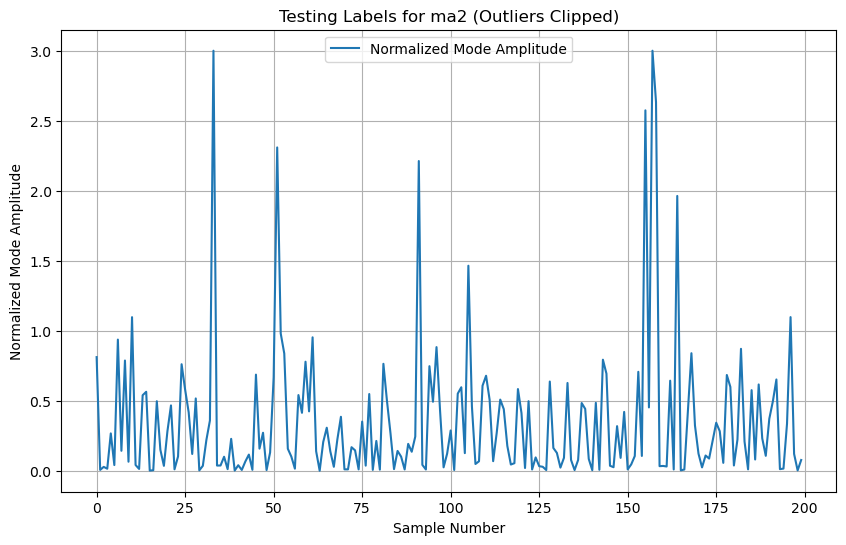

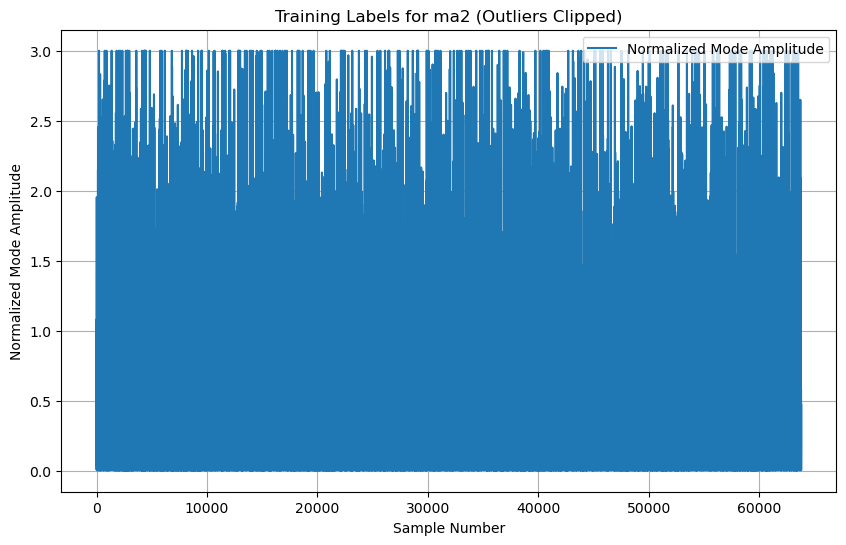

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       591,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 660,737 (2.52 MB)

 Trainable params: 660,737 (2.52 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 3:15 109ms/step - loss: 0.2778

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.2236  

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2108

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.2060

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.2177

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2206

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.2270

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.2315

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.2348

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2362

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2367

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2376

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2379

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2382

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2384

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2384

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2380

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2377

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2372

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2368

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2361

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2354

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2348

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2341

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2334

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2328

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2322

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2318

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2312

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2306

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2301

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2297

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2294

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2290

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2286

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2283

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2280

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2277

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2274

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2271

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2268

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2264

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2259

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2255

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2251

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2248

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2246

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2243

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2239

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2235

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2233

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2230

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2228

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2226

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2223

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2219

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2216

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2214

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2211

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2207

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2204

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2200

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2198

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2195

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2193

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2191

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2188

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2186

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2183

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2179

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2177

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2174

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2171

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2169

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2167

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2165

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2162

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2159

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2157

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2154

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2152

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2150

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2147

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2145

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2142

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2140

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2137

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2135

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2133

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2132

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2130

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2129

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2127

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2126

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2124

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.2123

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2123

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.2121

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2120

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2118

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2117

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2116

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2114

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2113

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2111

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2110

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2109

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2107

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2104

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2103

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2102

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2100

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2099

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2097

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2096

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2095

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2093

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2092

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2091

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2089

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2088

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2087

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2086

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2085

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2083

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2082

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2081

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2079

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2078

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2077

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2076

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2074

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2073

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2072

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2071

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2070

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2069

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2067

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2066

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2065

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2063

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2062

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2060

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2058

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2056

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2055

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2053

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2052

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2051

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2050

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2048

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2047

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2046

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2045

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2044

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2043

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2042

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2040

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2039

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2038

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2037

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2036

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2035

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2034

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2033

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2032

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2031

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2030

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2029

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2028

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2026

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2025

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2024

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2023

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2022

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2020

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2019

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2018

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2017

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2016

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2015

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2014

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2013

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2013

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2012

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2011

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2010

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2009

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2008

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2007

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2006

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2005

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2004

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2003

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2002

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2001

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2000

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1999

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1998

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1997

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1997

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1995

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1994

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1994

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1992

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1991

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1990

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1988

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1987

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1986

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1985

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1984

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1983

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1982

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1980

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1979

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1978

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1977

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1975

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1974

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1973

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1972

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1971

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1969

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1968

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1967

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1966

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1965

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1964

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1963

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1962

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1961

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1960

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1960

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1959

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1958

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1958

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1956

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1955

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1954

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1953

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1952

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1952

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1951

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1950

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1949

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1948

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1947

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1947

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1946

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1945

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1944

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1943

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1942

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1941

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1940

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1939

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1939

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1938

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1937

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1936

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1936

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1935

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1934

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1934

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1933

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1932

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1932

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1931

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1930

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1930

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1929

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1928

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1928

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1927

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1926

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1926

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1925

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1924

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1923

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1923

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1922

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1921

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1921

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1920

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1919

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1919

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1918

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1917

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1916

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1916

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1915

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1914

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1913

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1913

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1912

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1911

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1911

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1910

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1910

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1909

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1908

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1908

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1907

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1907

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1906

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1906

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1905

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1905

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1904

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1904

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1903

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1902

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1902

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1901

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1901

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1900

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1900

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1899

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1899

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1898

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1898

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1897

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1896

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1896

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1895

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1895

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1894

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1894

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1893

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1892

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1892

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1891

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1891

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1890

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1890

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1889

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1888

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1888

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1887

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1887

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1886

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1886

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1885

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1884

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1884

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1883

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1883

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1882

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1882

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1881

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1881

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1880

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1880

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1879

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1879

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1879

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1878

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1878

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1877

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1877

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1876

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1876

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1875

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1875

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1874

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1874

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1873

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1873

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1872

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1872

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1872

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1871

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1871

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1870

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1870

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1870

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1869

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1869

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1868

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1868

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1868

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1867

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1867

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1866

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1866

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1866

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1865

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1865

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1865

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1864

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1863

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1863

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1862

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1862

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1861

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1861

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1860

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1860

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1859

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1859

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1859

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1858

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1858

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1858

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1857

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1857

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1857

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1856

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1856

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1855

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1855

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1855

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1854

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1854

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1853

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1853

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1853

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1852

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1852

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1851

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1851

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1851

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1850

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1850

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1850

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1849

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1849

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1849

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1848

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1848

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1848

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1847

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1847

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1846

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1846

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1846

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1845

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1845

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1845

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1844

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1844

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1844

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1843

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1843

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1843

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1842

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1842

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1841

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1841

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1841

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1840

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1840

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1839

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1839

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1839

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1838

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1838

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1838

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1837

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1837

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1836

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1836

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1836

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1835

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1835

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1835

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1834

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1834

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1834

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1833

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1833

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1833

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1832

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1832

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1832

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1831

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1831

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1831

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1830

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1830

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1830

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1829

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1829

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1829

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1828

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1828

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1828

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1827

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1827

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1827

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1826

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1826

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1825

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1825

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1825

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1824

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1824

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1824

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1823

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1823

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1823

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1822

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1822

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1822

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1821

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1821

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1821

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1820

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1820

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1819

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1819

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1819

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1818

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1818

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1818

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1817

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1817

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1817

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1816

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1816

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1816

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1815

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1815

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1814

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1814

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1814

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1813

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1813

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1813

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1813

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1812

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1812

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1812

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1811

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1811

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1811

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1810

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1810

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1810

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1809

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1809

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1809

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1808

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1808

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1808

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1807

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1807

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1807

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1807

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1806

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1806

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1806

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1805

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1805

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1805

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1804

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1804

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1804

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1803

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1803

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1803

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1802

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1802

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1802

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1802

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1801

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1801

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1801

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1801

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1800

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1800

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1800

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1800

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1799

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1799

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1799

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1799 

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1798

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1798

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1798

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1797

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1797

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1797

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1797

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1796

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1796

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1796

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1796

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1796

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1795

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1795

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1795

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.1794

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1794

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1794

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1794

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1793

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1793

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1793

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1792

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1792

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.1792

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1791

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1791

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1791

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1791

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1790

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1790

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1790

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1789

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1789

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1789

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1789

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1788

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1788

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1788

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1787

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1787

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1787

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1786

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1786

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1786

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1786

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1786

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1785

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1785

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1785

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1784

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1784

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1784

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1784

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1784

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1783

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1783

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1783

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1783

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1782

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1782

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1782

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.1782

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1782

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1781

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1781

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1781

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1781

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1780

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1780

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1780

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1780

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1779

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.1779

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1779

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1778

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1778

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1778

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1778

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1777

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1777

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1777

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1776

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1776

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1776

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1776

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1776

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1775

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1775

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1775

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1775

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1774

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1774

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1774

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1774

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1774

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1773

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1773

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1773

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1772

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1772

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1772

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1772

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1771

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1771

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1771

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1771

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1770

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1770

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1770

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1770

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1769

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1769

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1769

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1769

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1768

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1768

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1768

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1768

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1768

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1767

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1767

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1767

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1767

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1767

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1766

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1766

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1766

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1766

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1765

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1765

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1765

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1765

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1765

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1764

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1764

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1764

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1764

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1764

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1763

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1763

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1763

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1763

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1762

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1762

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1762

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1762

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1762

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1761

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1761

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1761

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1761

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1761

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1760

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1760

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1760

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1760

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.1760 - val_loss: 0.1531


Epoch 2/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2794

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2201

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2008

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1905

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1835

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1776

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1727

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1679

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1638

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1605

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1576

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1554

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1534

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1523

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1514

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1509

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1505

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1498

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1494

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1489

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1481

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1476

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1468

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1464

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1459

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1454

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1445

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1440

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1434

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1429

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1424

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1419

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1415

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1411

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1408

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1404

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1401

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1398

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1394

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1391

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1387

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1383

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1380

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1377

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1374

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1371

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1369

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1367

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1365

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1363

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1361

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1359

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1358

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1355

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1354

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1352

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1350

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1349

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1348

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1347

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1346

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1346

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1345

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1344

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1343

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1343

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1342

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1342

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1341

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1341

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1340

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1340

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1340

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1339

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1339

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1339

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1338

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1338

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1338

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1338

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1338

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1338

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1338

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1339

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1339

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1339

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1340

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1341

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1341

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1341

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1341

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1341

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1342

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1342

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1342

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1343

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1343

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1343

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1343

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1343

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1344

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1344

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1344

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1344

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1345

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1345

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1345

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1345

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1346

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1346

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1346

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1346

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1347

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1347

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1347

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1347

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1348

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1348

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1348

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1348

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1349

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1349

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1349

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1350

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1350

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1350

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1351

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1351

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1352

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1352

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1353

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1353

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1353

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1354

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1354

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1354

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1355

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1355

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1355

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1356

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1356

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1357

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1357

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1357

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1357

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1358

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1358

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1358

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1359

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1359

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1359

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1359

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1360

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1360

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.1360

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.1360

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.1361

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.1361

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1361

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1361

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1362

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1362

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1362

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1362

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1363

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1363

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1363

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1364

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1364

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1364

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1365

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1365

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1365

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1366

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1366

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1366

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1366

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.1367

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1367

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1367

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1368

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1368

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1369

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1369

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1369

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1369

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1370

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1370

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1370

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1370

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1371

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 27ms/step - loss: 0.1371

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1371

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1371

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1371

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1372

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1372

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1372

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1373

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1373

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1373

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1373

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1374

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1374

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.1374

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.1374

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1375

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1375

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1375

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1375

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1375

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1376

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1376

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1376

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1376

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1376

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1377

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1378

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1379

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1379

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1379

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1379

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1379

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1379

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1380

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1381

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1381

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1381

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1381

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1381

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1381

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1382

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1383

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1384

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1384

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1384

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1384

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1384

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1384

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1384

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 26ms/step - loss: 0.1385

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 26ms/step - loss: 0.1385

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1385

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 26ms/step - loss: 0.1386

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step - loss: 0.1386

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1386

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1386

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1386

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1385

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1385

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1385

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1385

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1385

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1385

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1385

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1385

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1386

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1386

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1386

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1386

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1387

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1387

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1388

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1388

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1388

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1388

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1388

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1388

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1388

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1388

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1388

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1388

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1389

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1389

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1389

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.1389

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.1390

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.1390

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1390

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1390

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1390

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.1391

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1391

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1391

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1391

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391 

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1391

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1391

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1392

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1392

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1392

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1393

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1393

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1393

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1393

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1394

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1394

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1394

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1394

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.1394

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1394

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1394

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1394

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1395

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1395

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1395

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1395

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1395

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1395

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.1395 - val_loss: 0.1311


Epoch 3/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 37ms/step - loss: 0.0679

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0649

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0699 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.0762

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0808

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0846

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0877

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.0902

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0931

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0953

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0965

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0984

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1013

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1042

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1070

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1095

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1115

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1132

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1147

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1160

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1175

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1184

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1193

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1203

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1212

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1220

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1227

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1234

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1239

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1243

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1246

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1250

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1254

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1258

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1262

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1266

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1271

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1276

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1281

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1285

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1290

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1293

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1297

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1300

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1304

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1308

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1311

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1314

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1316

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1319

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1321

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1323

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1325

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1327

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1329

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1331

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1333

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1335

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1337

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1339

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1341

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1342

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1344

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1345

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1346

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1347

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1348

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1349

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1350

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1351

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1351

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1352

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1352

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1353

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1353

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1353

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1354

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1354

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1354

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1355

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1355

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1354

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1354

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1354

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1354

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1353

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1353

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1353

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1352

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1352

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1352

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1352

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1351

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1351

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1351

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1351

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1351

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1352

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1352

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1353

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1353

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1353

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1353

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1353

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1353

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1353

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1353

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1354

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1355

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1355

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1355

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1354

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1354

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1354

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1354

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1354

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1353

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1353

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1353

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1352

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1352

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1351

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1351

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1351

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1351

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1351

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1350

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1350

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1350

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1350

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1349

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1349

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1349

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1348

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1348

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1348

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1348

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1348

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1348

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1348

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1348

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1347

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1346

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1346

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1345

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1345

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1345

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1344

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1343

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1343

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1343

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1343

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1343

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1342

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1342

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1341

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1341

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1341

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1341

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1341

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1341

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1341

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1340

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1340

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1340

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1339

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1339

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1338

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1338

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1338

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1338

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338 

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1338

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1338

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1338

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1338

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1338

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1338

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1337

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1337

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1337

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1337

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1337

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1337

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1336

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1336

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1336

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1335

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1335

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1335

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1335

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1335

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1335

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1335

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1334

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1334 - val_loss: 0.1454


Epoch 4/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2708

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1920

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1610

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1541

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1464

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1400

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1371

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1353

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1322

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1289

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1272

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1258

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1245

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1232

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1225

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1226

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1226

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1225

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1227

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1227

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1228

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1228

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1229

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1231

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1232

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1231

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1231

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1231

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1232

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1234

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1237

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1239

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1241

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1242

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1245

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1247

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1250

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1251

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1253

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1254

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1254

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1256

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1257

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1258

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1259

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1260

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1261

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1262

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1263

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1263

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1264

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1265

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1266

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1267

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1267

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1268

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1268

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1269

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1271

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1272

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1273

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1273

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1274

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1274

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1275

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1275

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1276

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1276

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1277

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1277

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1278

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1278

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1279

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1279

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1279

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1279

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1280

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1280

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1280

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1280

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1280

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1280

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1280

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1281

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1281

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1281

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1283

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1283

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1284

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1285

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1285

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1286

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1286

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1287

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1287

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1288

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1288

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1288

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1289

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1289

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1290

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1290

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1291

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1291

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1291

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1292

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1292

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1293

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1293

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1293

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1294

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1294

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1294

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1295

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1296

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1296

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1297

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1297

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1297

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1298

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1298

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1299

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1299

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1299

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1300

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1300

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1300

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1300

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1301

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1301

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1301

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1301

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1301

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1301

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1300

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1300

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1300

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1300

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1299

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1299

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1299

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1299

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1299

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1299

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1299

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1299

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1299

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1299

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1299

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1298

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1298

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1298

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1298

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1297

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1297

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1297

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1296

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1296

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1296

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1296

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1295

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1295

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1295

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1295

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1295

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1295

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1295

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1295

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1295

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1294

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1294

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1293

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1293

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1293

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1293 

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1293

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1293

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1292

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1292

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1292

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1292

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1292

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1292

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1291

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1291

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1291

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1291

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1290

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1290

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1290

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1290

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1289

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1289

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1289

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1289

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1289

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1289 - val_loss: 0.1223


Epoch 5/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0800

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1340

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1458

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1452

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1438

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1419

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1392

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1371

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1358

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1349

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1337

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1328

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1323

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1316

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1310

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1304

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1299

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1294

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1290

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1287

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1284

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1283

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1282

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1281

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1281

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1280

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1280

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1280

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1280

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1280

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1280

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1280

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1281

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1282

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1283

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1285

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1287

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1290

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1292

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1293

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1295

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1296

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1297

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1297

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1298

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1298

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1298

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1298

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1298

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1297

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1297

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1297

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1296

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1295

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1295

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1294

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1293

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1292

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1292

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1291

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1290

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1290

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1290

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1290

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1290

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1289

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1289

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1289

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1289

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1289

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1289

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1289

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1289

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1288

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1288

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1288

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1287

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1286

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1286

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1286

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1286

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1285

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1285

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1285

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1284

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1284

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1284

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1284

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1283

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1283

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1283

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1282

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1282

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1281

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1281

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1281

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1280

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1280

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1280

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1279

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1279

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1278

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1278

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1277

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1277

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1277

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1276

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1276

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1275

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1275

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1275

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1274

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1274

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1273

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1273

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1273

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1272

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1272

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1272

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1272

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1271

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1271

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1271

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1270

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1270

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1270

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1269

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1269

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1269

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1269

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1268

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1268

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1268

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1268

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1267

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1267

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1267

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1266

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1265

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1265

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1265

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1265

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1265

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1265

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1264

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1264

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1263

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1263

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1262

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1262

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1262

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1261

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1261

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1261

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1261

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1261

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1261

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1261

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1261

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1261

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1260

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1260

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1260

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1260

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1259

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1259

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1259

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1258

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1258

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1257

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1257

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1257

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1256

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1256

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1256

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1255

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1255

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1255

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1255 

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1255

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1255

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1254

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1254

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1254

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1254

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1254

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1254

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1254

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1253

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1253

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1253

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1253

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1253

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1253

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1253

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1253

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1253

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1253

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1252

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1252 - val_loss: 0.1370


Epoch 6/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1314

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1138

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1146

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1269

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1283

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1299

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1297

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1291

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1287

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1287

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1285

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1281

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1271

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1263

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1256

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1251

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1245

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1241

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1237

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1234

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1233

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1231

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1229

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1227

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1226

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1224

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1222

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1221

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1219

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1218

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1217

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1215

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1214

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1213

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1211

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1210

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1208

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1206

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1205

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1203

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1201

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1200

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1199

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1197

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1196

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1195

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1194

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1193

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1191

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1190

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1189

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1189

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1188

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1187

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1186

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1186

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1185

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1184

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1183

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1182

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1181

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1180

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1178

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1178

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1177

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1176

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1175

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1173

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1173

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1172

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1172

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1171

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1171

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1171

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1170

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1170

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1170

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1169

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1169

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1169

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1168

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1168

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1168

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1167

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1168

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1168

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1169

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1169

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1169

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1169

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1169

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1169

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1169

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1170

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1171

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1171

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1171

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1171

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1172

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1173

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1173

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1173

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1173

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1173

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1174

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1174

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1174

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1174

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1174

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1174

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1175

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1176

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1177

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1178

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1178

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1179

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1179

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1179

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1179

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1179

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1179

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1179

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1179

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1180

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1180

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1181

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1182

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1182

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1182

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1183

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1183

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1183

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1183

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1183

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1183

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1183

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1184

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1184

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1184

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1185

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1185

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1185

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1185

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1186

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1187

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1187

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1188

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1188

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1188

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1188

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1189

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1189

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1189

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1189

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1189

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1189

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1190

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1190

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1191

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1192

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1192

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1192

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1192

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1193

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1194

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1195

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1195

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1196

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1196

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1197

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1197

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1198

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1198

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1198

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1198

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1198

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1199

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1199

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1199

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1199

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1199

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1199

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1199

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1200

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1200

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1200

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1201

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201 

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1201

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1201

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1202

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1202

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1202

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1202

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1202

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1202

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1202

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1202

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1203

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1203

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1203 - val_loss: 0.1408


Epoch 7/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2063

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1708

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1602

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1500

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1453

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1447

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1445

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1470

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1486

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1487

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1484

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1484

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1481

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1477

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1470

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1460

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1454

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1448

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1441

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1435

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1427

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1420

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1415

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1411

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1406

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1400

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1395

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1389

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1384

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1380

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1375

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1371

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1367

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1363

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1360

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1357

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1354

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1350

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1346

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1343

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1341

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1339

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1336

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1333

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1330

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1327

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1324

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1321

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1318

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1315

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1312

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1310

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1307

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1304

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1302

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1300

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1298

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1297

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1295

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1293

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1292

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1290

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1289

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1287

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1285

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1283

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1281

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1280

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1278

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1276

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1274

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1273

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1271

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1270

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1268

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1267

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1266

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1265

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1263

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1262

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1261

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1259

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1258

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1257

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1256

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1254

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1253

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1253

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1251

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1250

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1249

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1248

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1246

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1245

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1244

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1243

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1242

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1241

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1240

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1239

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1238

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1237

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1237

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1236

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1235

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1235

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1234

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1233

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1233

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1232

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1232

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1231

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1231

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1230

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1230

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1229

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1229

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1228

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1227

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1227

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1226

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1226

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1225

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1225

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1224

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1224

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1223

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1223

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1223

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1222

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1222

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1221

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1221

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1220

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1220

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1219

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1219

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1218

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1218

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1217

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1217

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1216

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1216

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1216

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1215

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1215

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1215

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1214

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1214

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1214

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1213

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1213

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1213

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1213

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1212

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1212

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1212

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1212

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1211

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1211

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1211

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1210

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1210

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1210

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1209

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1209

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1209

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1209

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1208

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1207

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1207

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1207

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1207

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1207

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1207

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1207

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1206

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1205

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1205

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1204

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1204

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1204

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1204

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1204

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1204

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1204

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1204

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1204

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1204

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1203

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1203

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1203

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1203

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1203

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1202

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1202

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1201

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1201

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1201

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1200

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1199

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1199

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1199

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1199

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1198

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1198

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1198

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1198

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1198

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1198

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1197

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1197

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1196

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1196

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1195

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1195

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1195

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1194

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1193

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1193

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1192

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1192

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1191

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1191

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1190

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1190

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1189

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1189

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1189

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1189

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1189

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1189

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1189

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1188

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1188

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1188

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1187

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1187

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1187

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187 

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1187

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1187

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1187

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1186

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1186

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1186

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1186

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1185

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1185

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1185

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1185

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1185

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1185 - val_loss: 0.1186


Epoch 8/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2090

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1578

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1477

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1449

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1463

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1460

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1475

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1483

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1490

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1496

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1500

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1506

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1508

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1506

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1502

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1498

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1496

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1495

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1496

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1498

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1498

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1498

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1498

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1498

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1497

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1495

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1493

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1489

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1486

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1482

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1480

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1478

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1476

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1473

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1470

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1467

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1465

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1463

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1460

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1458

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1456

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1454

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1452

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1450

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1449

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1448

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1447

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1446

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1444

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1443

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1442

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1441

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1439

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1438

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1437

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1436

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1434

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1433

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1431

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1430

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1428

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1426

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1425

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1424

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1423

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1422

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1420

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1419

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1417

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1416

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1415

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1414

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1412

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1411

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1410

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1409

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1408

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1407

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1406

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1405

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1404

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1403

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1402

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1401

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1400

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1399

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1399

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1398

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1397

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1396

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1396

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1395

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1394

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1393

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1392

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1391

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1390

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1389

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1388

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1386

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1385

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1384

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1383

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1382

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1381

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1380

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1379

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1378

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1378

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1377

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1376

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1375

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1374

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1374

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1373

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1372

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1371

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1371

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1370

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1369

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1368

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1368

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1367

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1366

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1365

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1364

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1364

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1363

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1362

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1361

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1360

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1359

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1358

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1358

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1357

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1356

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1355

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1354

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1353

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1352

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1351

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1351

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1350

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1349

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1348

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1347

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1346

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1346

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1345

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1344

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1343

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1342

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1342

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1341

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1340

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1339

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1338

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1337

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1337

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1336

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1335

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1335

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1334

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1333

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1332

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1332

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1331

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1330

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1330

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1329

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1328

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1328

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1327

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1326

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1326

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1325

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1324

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1324

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1323

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1323

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1322

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1322

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1321

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1321

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1321

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1320

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1320

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1319

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1319

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1318

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1318

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1317

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1316

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1316

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1315

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1314

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1314

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1313

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1312

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1312

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1311

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1311

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1310

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1310

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1309

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1308

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1308

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1307

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1306

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1305

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1305

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1304

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1304

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1303

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1303

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1302

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1302

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1301

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1301

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1300

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1300

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1299

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1298

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1298

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1297

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1297

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1296

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1295

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1295

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1294

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1294

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1293

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1292

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1292

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1291

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1291

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1290

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1289

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1289

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1289

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1288

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1288

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1287

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1287

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1286

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1285

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1285

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1284

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1284

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1283

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1283

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1282

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1282

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1281

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1281

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1280

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1280

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1279

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1279

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1278

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1278

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1277

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1277

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1276

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1276

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1275

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1275

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1274

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1274

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1273

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1273

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1272

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1272

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1271

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1271

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1271

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1270

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1270

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1270

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1269

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1269

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1268

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1268

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1267

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1267

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1266

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1266

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1265

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1265

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1265

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1262

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1262

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1262

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1262

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1261

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1261

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1261

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1260

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1260

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1260

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1259

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1259

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1258

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1258

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1258

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1257

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1257

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1256

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1256

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1256

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1255

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1255

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1255

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1254

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1254

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1254

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1253

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1253

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1253

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1252

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1252

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1252

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1251

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1251

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1251

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1251

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1250

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1250

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1250

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1249

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1249

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1249

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1248

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1248

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1248

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1248

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1247

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1247

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1247

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1246

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1246

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1246

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1245

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1245

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1245

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1245

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1244

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1244

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1244

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1244

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1243

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1243

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1243

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1243

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1242

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1242

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1242

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1242

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1241

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1241

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1241

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1241

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1240

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1240

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1240

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1240

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1239

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1239

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1239

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1239

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1238

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1238

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1238

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1238

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1237

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1237

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1237

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1237

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1237

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1236

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1236

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1236

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1236

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1236

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1236

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1235

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1235

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1235

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1235

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1234

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1234

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1234

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1234

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1234

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1233

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1233

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1233

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1233

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1233

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1232

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1232

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1232

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1232

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1232

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1232

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1231

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1230

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1230

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1230

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1230

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1230

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1230

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1230

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1230

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1229

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1228

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1227

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1227

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1226

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1225

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1225

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1225

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1225

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1225

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1225

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1225

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1225

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1224

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1223

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1223

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1222

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1221

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221 

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1221

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1220

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1219

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1219

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1219

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1218

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1218

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1217

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1216

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1216

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1216

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1216

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1216

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1215

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1215

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1215

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1214

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1213

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1213

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1212

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1212

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1212

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1212

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1212

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1212

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1211

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1211

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1211

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1211

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1210

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1210

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1209

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1208

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1208

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1207

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1207

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1207

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1207

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1207

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1207 - val_loss: 0.1206


Epoch 9/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1387

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1129

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1213

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1206

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1194

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1185

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1189

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1192

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1191

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1188

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1184

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1186

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1189

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1194

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1198

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1203

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1207

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1212

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1215

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1217

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1217

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1216

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1214

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1214

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1213

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1212

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1210

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1208

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1207

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1204

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1202

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1200

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1198

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1197

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1196

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1196

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1195

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1193

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1192

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1191

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1190

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1188

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1186

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1184

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1183

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1181

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1179

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1178

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1174

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1173

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1172

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1170

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1169

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1168

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1167

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1166

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1165

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1165

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1165

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1164

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1164

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1164

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1163

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1163

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1163

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1162

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1162

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1161

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1161

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1160

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1160

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1160

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1159

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1158

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1158

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1158

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1158

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1158

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1158

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1159

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1158

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1158

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1158

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1159

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1158

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1158

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1158

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1158

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1158

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1158

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1157

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1157

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1158

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1158

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1158

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1158

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1158

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1159

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1159

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1158

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1158

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1157

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1156

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1156

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1156

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1156

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1156

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1156

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1156

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1155

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1155

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1154

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1154

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1154

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1154

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1154

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1154

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1154

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1154

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1153

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1153

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1152

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1152

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1152

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1152

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1153

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1153

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1153

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1153

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1153

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1153

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1153

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1154

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1154

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1154

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1154

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1154

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1154

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1154

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1153

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1153

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1153

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1153

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1153

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1153

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1153

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1153

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1152

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1152

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1151

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1151

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1151

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151 

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1151

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1150

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1150

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1150

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1150

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1150

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1150

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1150

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1150

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1149

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1149

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1149

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1149

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1149

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1148

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1148

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1148

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1148

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1148

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1148

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1148 - val_loss: 0.1167


Epoch 10/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.0907

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1033

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1043

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1039

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1038

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1047

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1059

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1061

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1062

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1063

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1059

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1052

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1049

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1046

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1042

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1042

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1042

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1042

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1045

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1050

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1054

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1059

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1068

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1073

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1078

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1083

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1087

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1091

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1095

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1098

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1102

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1105

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1108

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1110

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1113

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1115

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1117

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1118

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1120

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1122

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1123

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1125

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1126

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1128

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1129

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1131

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1132

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1133

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1134

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1135

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1135

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1135

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1136

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1136

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1137

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1138

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1138

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1139

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1140

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1140

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1141

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1142

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1142

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1143

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1143

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1143

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1143

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1144

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1143

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1143

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1143

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1142

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1142

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1142

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1142

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1141

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1141

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1141

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1141

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1140

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1140

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1140

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1140

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1140

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1140

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1139

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1138

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1138

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1138

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1138

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1138

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1137

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1137

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1137

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1137

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1136

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1136

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1136

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1136

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1135

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1135

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1135

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1135

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1135

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1135

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1134

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1133

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1133

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1133

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1133

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1133

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1133

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1133

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1133

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1132

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1132

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1132

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1132

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1131

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1131

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1130

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1130

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1130

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1130

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1130

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1130

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1130

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1130

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1130

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1129

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1129

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1128

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1128

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1128

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1127

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1126

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1126

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1126

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1126

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1126

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1126

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1126

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1127

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1127

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1127

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1127

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1127

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1127

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1128

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128 

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1128

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1129

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1129

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1129

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1130

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1130

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1130

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1130

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1130

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1130

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1130

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1130 - val_loss: 0.1142


Epoch 11/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2740

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1672

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1515

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1332

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1254

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1210

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1179

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1171

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1166

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1154

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1149

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1147

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1147

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1143

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1139

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1135

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1131

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1129

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1127

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1124

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1122

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1120

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1118

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1117

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1116

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1114

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1113

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1111

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1110

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1109

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1108

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1108

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1108

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1108

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1109

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1109

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1109

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1109

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1109

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1110

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1111

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1111

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1112

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1113

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1113

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1113

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1114

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1114

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1115

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1115

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1115

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1115

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1116

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1116

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1116

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1115

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1114

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1114

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1114

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1113

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1113

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1113

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1113

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1112

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1112

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1112

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1111

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1111

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1111

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1110

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1109

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1109

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1109

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1108

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1107

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1107

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1107

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1107

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1107

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1107

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1107

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1106

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1106

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1106

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1106

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1107

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1107

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1107

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1107

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1107

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1107

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1107

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1108

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1108

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1109

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1109

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1109

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1110

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1110

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1110

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1110

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1110

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1110

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1110

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1110

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1110

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1110

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1110

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1110

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1110

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1110

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1110

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1110

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1110

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1110

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1110

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1110

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1110

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1111

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1111

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1111

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1111

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1111

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1111

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1111

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1111 

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1112

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1112

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1112

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1113

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1113

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1113

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1113

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1113

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1113

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1113

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1113

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1114

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1114

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1114 - val_loss: 0.1116


Epoch 12/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1290

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1075

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1020

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1031

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1043

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1049

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1052

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1053

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1052

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1053

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1052

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1050

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1045

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1040

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1036

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1033

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1034

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1035

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1034

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1032

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1029

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1029

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1028

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1028

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1028

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1029

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1028

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1030

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1030

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1031

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1032

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1033

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1034

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1035

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1036

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1037

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1037

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1038

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1039

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1039

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1040

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1040

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1041

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1046

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1047

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1049

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1050

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1051

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1052

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1054

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1055

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1056

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1058

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1059

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1060

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1062

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1063

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1065

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1066

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1067

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1070

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1071

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1073

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1074

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1075

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1076

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1077

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1078

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1080

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1081

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1082

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1083

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1084

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1085

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1086

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1086

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1087

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1088

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1088

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1089

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1090

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1090

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1091

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1091

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1092

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1093

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1093

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1094

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1095

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1095

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1096

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1097

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1098

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1098

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1099

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1100

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1100

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1101

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1102

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1102

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1103

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1103

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1104

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1104

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1105

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1105

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1105

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1106

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1106

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1107

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1107

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1108

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1108

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1109

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1109

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1110

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1110

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1110

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1111

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1111

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1111

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1111

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1112

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1112

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1112

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1113

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1113

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1113

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1114

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1114

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1114

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1114

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1115

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1115

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1115

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1116

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1116

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1116

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1116

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1117

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1117

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1117

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1117

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1117

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1118

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1118

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1118

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1119

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1119

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1119

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1119

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1119

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1120

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1120

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1120

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1120

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1121

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1121

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1121

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1121

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1121

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1121

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1121

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1122

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1123

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1123

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1123

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1123

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1124

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1125

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1125

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1126

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1126

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1126

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1126

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1126

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1127

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1128

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1128

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1128

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1128

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1128

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1129

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1129

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1129

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1129

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1129

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1130

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1130

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1130

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1131

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1131

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1131

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1131

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1131

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1131

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1132

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1132

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1132

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1131

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1131

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1131

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1130

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1130

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1130

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1130

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1129

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1129

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1129

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1129

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1128

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1128

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1128

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1128

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1128

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1128

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1128

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1128

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1128

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1127

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1127

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1127

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1126

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1126

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1126 - val_loss: 0.1118


Epoch 13/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1601

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1067

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1036

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1036

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1026

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1032

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1063

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1072

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1098

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1123

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1140

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1151

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1156

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1159

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1162

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1162

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1162

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1164

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1167

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1168

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1169

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1170

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1172

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1175

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1177

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1177

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1177

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1177

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1176

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1176

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1177

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1177

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1177

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1177

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1177

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1177

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1176

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1176

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1175

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1175

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1174

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1174

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1173

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1172

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1171

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1170

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1170

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1169

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1168

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1167

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1166

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1166

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1165

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1165

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1164

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1164

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1163

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1163

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1162

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1162

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1162

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1162

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1162

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1161

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1160

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1160

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1160

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1160

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1160

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1160

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1159

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1159

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1160

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1160

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1160

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1160

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1161

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1161

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1161

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1161

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1161

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1161

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1162

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1163

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1163

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1163

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1163

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1163

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1163

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1163

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1163

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1164

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1164

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1163

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1163

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1162

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1162

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1162

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1161

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1160

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1160

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1160

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1160

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1160

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1160

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1160

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1160

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1160

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1159

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1158

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1158

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1157

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1157

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1157

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1157

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1156

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1156

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1156

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1156

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1156

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1156

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1155

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1155

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1155

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1155

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1155

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1154

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1154

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1154

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1154

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1154

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1153

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1153

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1152

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1152

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1152

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1151

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1151

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1151

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1150

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1149

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1149

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1148

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1148

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1148

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1147

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1147

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1147

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1147

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1147

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1146

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1146

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1146

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1145

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1144

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1144

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1144

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1143

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1143

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1143

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1143

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1143

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1143

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1142

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1142

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1142

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1141

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1141

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1141

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1141

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1140

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1140

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1140

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1140

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1140

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1140

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1139

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139 

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1139

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1138

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1138

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1137

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1137

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1136

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1136

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1135

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1135

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1135

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1135

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1135

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1134

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1134

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1134

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1134

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1133

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1133

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1133

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1133

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1132

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1132

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1132

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1132

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1132

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1132

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1131

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1131

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1130

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1130

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1130 - val_loss: 0.1060


Epoch 14/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0856

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1056

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0944

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0886

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0843

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0816

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0801

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0798

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0815

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0840

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0859

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0876

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0888

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0901

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0913

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0924

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0934

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0941

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0946

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0949

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0953

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0956

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0958

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0961

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0964

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0967

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0973

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0976

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0979

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0982

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0986

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0989

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0991

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0995

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0998

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1002

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1005

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1008

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1011

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1013

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1016

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1021

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1023

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1024

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1026

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1028

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1031

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1032

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1033

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1035

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1036

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1036

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1037

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1038

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1039

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1039

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1040

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1041

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1041

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1042

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1044

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1046

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1047

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1048

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1048

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1048

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1049

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1050

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1050

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1050

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1051

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1051

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1051

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1051

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1052

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1053

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1054

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1054

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1054

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1055

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1055

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1055

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1055

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1055

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1056

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1056

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1056

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1056

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1056

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1057

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1057

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1057

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1058

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1058

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1058

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1059

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1059

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1059

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1060

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1060

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1060

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1061

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1061

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1061

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1062

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1062

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1062

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1062

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1063

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1063

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1063

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1064

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1064

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1065

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1066

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1066

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1066

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1066

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1066

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1066

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1066

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1067

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1067

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1068

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1068

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1069

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1071

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1071

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1072

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1072

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1073

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1073

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1073

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1074

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1074

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1074

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1074

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1073

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1073

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1073

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1073

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1073

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1073

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1073

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1073

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1073

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1073

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1073

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1073

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1073

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1073

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1073

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1073

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1073

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1073

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1073

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1073

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1073

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1073

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1073

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1073

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073 

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1073

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1073

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1073

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1073

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1073

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1074

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1074

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1074

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1074

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1074

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1075

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1075

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1075

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1075

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1075

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1075

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1075

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1075

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1075 - val_loss: 0.1093


Epoch 15/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1658

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1435

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1368

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1348

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1320

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1298

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1285

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1283

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1275

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1268

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1260

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1253

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1245

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1240

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1233

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1226

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1220

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1213

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1208

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1203

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1198

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1192

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1189

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1186

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1182

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1178

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1175

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1174

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1171

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1168

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1164

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1162

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1160

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1157

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1155

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1154

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1153

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1152

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1151

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1150

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1148

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1147

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1146

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1145

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1144

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1143

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1142

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1141

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1141

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1140

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1139

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1138

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1137

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1137

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1136

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1135

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1134

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1134

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1133

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1132

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1131

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1129

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1128

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1127

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1126

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1125

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1124

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1123

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1122

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1121

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1120

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1119

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1117

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1116

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1115

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1114

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1113

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1112

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1111

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1110

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1109

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1107

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1106

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1105

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1104

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1103

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1102

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1102

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1101

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1100

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1099

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1099

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1098

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1097

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1097

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1097

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1096

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1096

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1095

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1095

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1095

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1094

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1094

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1094

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1093

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1093

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1093

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1093

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1091

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1091

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1091

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1090

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1090

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1089

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1089

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1088

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1088

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1088

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1087

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1087

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1086

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1086

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1086

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1085

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1085

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1085

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1085

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1085

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1084

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1083

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1083

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1083

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1083

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1083

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1082

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1082

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1082

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1082

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1082

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1081

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1081

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1081

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1081

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1080

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1080

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1080

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1079

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1079

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1079

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1079

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1078

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1078

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1078

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1078

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1077

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1076

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1076

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1076

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1076

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1076

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1076

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1076

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1076

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1075

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1074

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1073

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1072

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1072

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1072

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1072

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1072

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1072

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1072

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1071

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1070

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1070

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1070

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1070

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1070

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1070

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1070

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1070

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1070

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1070

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1069

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1069

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1069

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1069

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1069

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1069

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1069

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1069

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1069

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1069

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1069

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1069

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1070

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1070

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1070

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1070

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070 

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1070

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1071

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1071

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1071

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1071

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1071

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1071

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1071

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1071

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1072

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1072

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1072

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1072

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1072

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1072

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1072

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1072

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1072

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1072 - val_loss: 0.1099


Epoch 16/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0744

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0846

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0788

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0802

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0807

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0810

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0827

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0833

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0833

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0829

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0831

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0837

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0842

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0847

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0852

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0856

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0859

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0861

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0863

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0867

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0873

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0878

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0883

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0887

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0890

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0892

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0895

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0898

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0902

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0906

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0910

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0915

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0919

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0923

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0926

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0930

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0933

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0937

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0940

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0943

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0946

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0949

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0952

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0954

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0957

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0960

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0963

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0968

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0972

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0974

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0978

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0980

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0982

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0984

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0986

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0987

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0989

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0990

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0992

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0993

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0994

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0996

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0997

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1000

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1002

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1003

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1005

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1006

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1008

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1009

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1010

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1012

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1015

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1016

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1017

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1017

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1018

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1019

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1020

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1021

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1021

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1022

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1023

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1023

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1024

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1025

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1025

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1026

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1026

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1027

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1028

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1028

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1029

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1029

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1030

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1030

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1031

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1032

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1032

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1033

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1033

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1037

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1039

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1040

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1040

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1041

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1042

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1044

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1044

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1044

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1045

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1045

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1045

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1045

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1046

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1047

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1048

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1048

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1049

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1049

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1050

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1050

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1050

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1050

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1050

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1050

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1051

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1052

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1052

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1053

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1053

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1054

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1054

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1054

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1055

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1055

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1055

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1055

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1055

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1055

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1055

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1056

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1056

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1056

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1056

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1057

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1057

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1057

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1057

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1057

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1057

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1058

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1058

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1059

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1059

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1059

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1059

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1059

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1060

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1060

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1060

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1060

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1061

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1061

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061 

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1062

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1062

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1062

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1063

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1063

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1063

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1063

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1063

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1063

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1063

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1063

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1063

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1063

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1064

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1064

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1064 - val_loss: 0.1088


Epoch 17/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1585

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1501

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1287

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1184

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1122

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1083

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1053

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1021

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1000

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0990

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0982

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0975

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0973

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0976

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0981

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0984

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0991

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0998

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1003

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1008

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1012

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1014

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1016

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1018

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1018

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1018

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1017

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1017

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1016

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1016

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1016

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1017

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1019

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1020

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1022

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1024

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1025

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1027

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1030

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1033

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1037

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1038

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1040

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1041

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1043

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1045

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1046

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1047

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1048

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1049

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1050

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1050

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1051

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1052

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1053

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1054

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1054

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1055

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1056

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1056

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1057

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1058

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1059

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1059

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1060

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1061

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1062

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1063

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1063

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1064

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1065

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1066

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1067

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1067

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1068

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1069

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1069

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1070

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1070

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1071

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1071

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1071

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1072

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1072

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1072

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1073

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1073

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1073

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1073

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1074

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1074

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1075

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1075

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1076

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1076

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1076

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1077

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1078

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1080

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1084

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1084

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1084

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1084

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1084

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1085

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1085

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1085

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1085

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1086

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1086

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1086

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1086

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1086

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1086

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1086

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1087

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1088

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1088

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1088

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1089

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1090

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1090

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1091

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1092

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1092

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1092

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1092

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1092

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1092

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1092

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1092

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1092

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1091

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1091

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1090

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1090

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1090

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1090

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1089

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1089

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1089

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1089

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1089

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1089

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1089

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1088

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1088

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1088

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1087

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1087

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1087

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1086

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086 

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1085

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1085

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1085

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1085

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1084

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1083

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1083

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1082

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1082

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1082

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1082

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1082

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1081

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1081

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1080

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1080 - val_loss: 0.1209


Epoch 18/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.1132

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0974 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0873

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0829

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0824

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0835

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0865

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0896

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0932

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0958

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0980

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0998

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1010

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1024

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1034

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1042

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1045

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1047

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1046

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1046

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1048

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1050

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1052

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1054

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1055

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1057

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1059

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1061

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1062

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1063

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1063

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1063

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1063

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1063

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1062

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1062

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1063

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1064

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1064

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1064

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1064

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1064

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1065

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1066

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1066

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1066

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1067

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1067

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1068

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1068

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1068

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1069

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1070

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1070

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1071

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1071

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1072

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1073

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1073

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1074

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1075

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1075

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1076

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1077

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1077

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1077

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1078

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1078

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1078

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1080

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1079

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1079

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1078

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1078

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1077

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1077

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1077

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1076

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1075

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1074

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1074

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1074

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1074

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1074

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1073

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1073

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1073

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1073

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1073

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1073

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1073

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1073

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1073

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1072

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1072

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1072

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1072

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1072

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1071

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1070

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1070

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1070

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1070

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1069

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1069

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1069

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1068

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1068

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1068

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1068

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1067

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1067

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1067

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1067

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1066

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1066

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1066

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1066

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1065

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1065

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1065

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1065

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1064

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1064

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1064

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1063

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1063

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1063

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1063

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1062

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1062

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1062

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1062

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1061

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1060

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1060

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1059

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1059

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1059

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1058

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1057

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1057

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1057

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1057

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1056

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1056

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1056

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1056

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1056

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1055

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1054

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1054

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1053

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1053

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1053

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1053

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1053

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1052

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1052

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1052

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1052

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1052

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1051

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1051

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1050

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1049

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1049

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1048

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1048

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1047

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1047

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1046

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1046

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1046

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1046

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1046

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1046

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1047

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1047

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1047

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1047

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1047

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047 

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1047

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1047

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1048

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1048

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1048

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1048

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1048

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1048

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1048

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1048

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1049

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1049

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1049

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1049

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1050

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1050 - val_loss: 0.1080


Epoch 19/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0662

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0611

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0644

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0767

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0815

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0832

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0836

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0834

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0843

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0858

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0875

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0884

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0898

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0911

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0920

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0927

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0931

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0934

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0938

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0940

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0942

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0943

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0947

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0948

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0951

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0950

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0948

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0948

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0947

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0945

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0944

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0944

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0946

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0946

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0948

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0949

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0957

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0958

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0959

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0961

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0966

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0967

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0968

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0969

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0970

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0970

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0971

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0973

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0980

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0981

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0981

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0982

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0982

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0982

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0982

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0983

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0987

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0987

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0988

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0988

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0990

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0990

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0991

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0991

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0992

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0992

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0993

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0993

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0994

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0994

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0994

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0999

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0999

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0999

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1000

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1000

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1000

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1000

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1001

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1001

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1001

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1002

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1002

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1002

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1003

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1003

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1003

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1004

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1004

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1004

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1004

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1005

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1005

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1005

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1006

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1006

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1006

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1006

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1007

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1007

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1007

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1007

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1010

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1011

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1011

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1011

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1011

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1012

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1012

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1012

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1012

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1013

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1013

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1013

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1013

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1013

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1014

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1014

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1014

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1014

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1015

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1015

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1015

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1015

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1015

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1016

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1016

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1016

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1016

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1016

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1017

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1017

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1017

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1017

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1017

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1018

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1018

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1018

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1018

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1018

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1019

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1019

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1019

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1019

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1019

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1020

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1021

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1021

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1021

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1022

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1023

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1023

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1023

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1023

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1023

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1023

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1024

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1025

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1026

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1027

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1027

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1029

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1030

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1030

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1030

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1031

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1032

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1032

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1032

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1033

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1033

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1033

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1033

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1033

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1037

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1037

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1037

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1037

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1037

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1038

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1038

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1038

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1039

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1040

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1040

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1040

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1040

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1040

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040 

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1040

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1040

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1040

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1041

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1041

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1041

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1041

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1041

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1041

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1041

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1041

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1041 - val_loss: 0.1074


Epoch 20/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0342

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0699

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0762

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0821

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0882

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0941

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0992

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1027

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1052

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1074

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1088

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1098

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1103

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1110

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1113

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1113

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1111

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1107

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1104

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1099

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1095

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1091

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1087

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1084

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1082

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1081

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1080

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1079

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1078

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1077

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1076

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1074

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1073

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1072

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1071

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1070

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1070

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1069

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1068

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1067

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1066

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1066

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1065

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1065

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1063

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1063

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1063

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1063

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1062

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1062

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1061

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1060

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1060

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1059

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1058

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1057

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1056

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1055

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1054

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1053

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1052

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1052

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1051

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1050

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1050

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1049

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1048

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1048

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1047

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1046

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1045

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1044

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1044

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1043

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1043

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1043

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1042

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1041

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1040

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1039

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1039

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1039

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1039

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1039

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1037

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1037

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1037

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1037

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1037

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1036

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1036

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1036

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1036

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1036

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1036

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1035

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1034

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1033

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1033

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1032

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1031

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1031

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1031

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1031

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1031

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1030

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1030

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1030

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1031

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1031

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1031

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1031

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1030

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1030

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1031

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1031

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1032

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1032

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1032

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1032

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1032

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1033

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1033

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1033

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1034

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1034

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1034

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1034

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1034

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1035

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1035

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1036

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1036

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1036

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1036

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1036

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1036

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1036

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1037

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1037

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1038

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1038

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1038

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1038

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1038 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1038

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1038

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1039

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1039

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1039

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1039

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1039

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1039

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1039

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1040

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1040

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1040

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1040

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1040 - val_loss: 0.1071


Epoch 21/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1945

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1453

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1259

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1178

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1166

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1142

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1117

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1100

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1089

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1077

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1066

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1057

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1053

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1050

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1049

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1047

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1046

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1045

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1045

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1046

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1047

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1048

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1051

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1053

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1056

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1058

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1059

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1060

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1061

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1062

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1062

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1062

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1063

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1063

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1064

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1064

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1065

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1066

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1066

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1066

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1067

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1067

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1067

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1067

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1068

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1069

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1070

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1071

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1072

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1073

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1074

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1074

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1075

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1075

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1075

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1076

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1076

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1077

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1077

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1078

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1078

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1079

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1079

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1080

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1080

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1081

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1081

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1082

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1082

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1083

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1084

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1084

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1085

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1085

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1086

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1086

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1086

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1087

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1088

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1088

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1088

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1088

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1089

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1090

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1090

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1090

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1090

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1090

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1090

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1090

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1091

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1092

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1092

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1093

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1094

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1095

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1095

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1095

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1095

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1096

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1096

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1097

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1097

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1097

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1097

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1097

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1098

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1098

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1098

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1097

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1097

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1097

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1097

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1097

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1097

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1097

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1097

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1097

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1096

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1096

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1096

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1096

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1096

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1096

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1095

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1095

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1095

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1094

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1093

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1093

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1093

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1092

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1092

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1091

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1091

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1091

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1090

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1090

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1089

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1089

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1088

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1088

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1087

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1087

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1086

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1085

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1084

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1084

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1084

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1083

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1083

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1083

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1083

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1083

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1083

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1082

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1082

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1082

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1082

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1082

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1081

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1081

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1080

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1079

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1079

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1078

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1078

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1078

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1078

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1078

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1077

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1077

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1077

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1077

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1077

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1077

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1076

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1076

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1075

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1075

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1075

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1075

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1075 - val_loss: 0.1127


Epoch 22/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0663

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0705

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0825

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0832

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0837

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0857

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0871

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0889

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0910

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0931

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0948

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0961

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0968

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0972

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0975

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0979

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0986

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0993

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0997

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1001

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1004

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1006

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1007

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1007

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1008

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1009

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1011

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1013

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1015

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1017

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1020

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1023

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1026

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1029

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1031

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1033

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1035

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1037

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1039

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1041

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1043

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1045

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1047

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1049

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1051

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1052

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1054

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1056

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1058

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1060

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1061

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1062

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1063

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1064

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1065

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1066

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1066

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1067

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1067

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1067

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1068

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1069

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1069

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1068

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1068

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1068

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1067

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1067

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1067

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1066

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1066

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1066

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1065

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1065

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1065

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1065

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1064

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1064

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1064

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1063

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1063

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1063

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1063

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1062

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1062

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1062

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1062

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1061

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1060

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1059

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1059

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1058

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1056

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1056

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1056

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1055

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1054

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1053

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1053

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1053

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1053

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1053

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1052

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1051

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1051

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1050

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1050

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1050

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1050

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1049

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1048

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1048

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1048

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1048

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1047

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1047

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1047

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1046

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1045

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1045

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1044

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1044

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1043

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1043

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1043

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1043

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1043

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1043

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1042

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1042

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1042

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1041

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1040

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1040

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1040

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1039

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1039

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1039

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1039

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1038

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1038

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1037

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1036

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1036

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1036

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1035

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1035

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1035

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1034

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1034

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1033

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1033

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1032

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1032

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1032

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1032

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1032

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1032

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1032

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1031

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1031

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031 

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1031

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1030

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1030

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1030

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1030

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1030

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1030

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1030

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1030

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1030

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1030

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1030

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1030

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1029

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1029

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1029

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1029

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1029

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1029

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1029 - val_loss: 0.1026


Epoch 23/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0737

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0996 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0955

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0910

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0903

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0920

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0928

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0929

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0928

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0927

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0923

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.0927

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0927

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0926

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0923

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0922

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0922

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0922

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0922

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0924

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0926

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0929

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0932

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0935

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0937

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0939

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0941

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0942

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0943

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0945

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0948

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0951

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0953

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0955

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0956

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0957

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0958

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0960

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0961

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0962

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0964

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0967

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0968

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0969

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0972

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0974

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0976

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0978

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0979

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0981

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0982

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0983

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0984

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0985

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0986

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0987

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0988

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0988

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0989

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0990

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0991

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0992

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0992

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0993

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0993

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0994

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0994

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0995

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0996

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0996

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0997

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0997

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0998

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1001

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1002

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1003

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1004

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1005

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1006

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1007

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1008

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1009

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1010

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1011

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1012

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1013

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1014

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1014

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1015

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1016

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1016

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1017

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1018

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1018

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1018

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1019

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1019

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1019

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1019

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1019

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1020

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1020

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1020

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1020

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1020

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1020

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1021

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1021

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1020

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1020

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1020

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1020

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1020

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1021

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1021

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1021

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1021

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1021

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1021

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1022

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1023

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1023

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1025

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1025

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1025

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1025

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1026

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1027

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1027

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1027

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1027

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1027

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1027

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1027

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1028

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1029

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1029

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1029

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1029

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1030

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1031

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1031

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1032

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1032

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1033

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1033

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1033

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1033

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1033

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1033

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1034

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1034

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1034

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1034

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1034

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1034

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1035

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1035

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1035

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1035

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1035

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1035

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1036

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1036

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1036

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1037

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1037

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1037

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1038

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1038

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1039

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1039

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1039

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1039

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1039

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1039

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1039

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1039

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1039

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1039

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1039

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1039

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1039

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039 

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1039

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1038

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1038

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1038

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1038

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1038

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1038

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1038

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1037

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1037

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1037

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1037

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1037

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1037

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1036

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1036

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1036

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.1036 - val_loss: 0.1081


Epoch 24/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0794

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0978

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1001

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0995

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1081

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1108

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1109

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1103

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1102

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1097

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1091

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1087

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1079

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1070

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1064

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1062

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1059

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1054

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1048

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1042

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1036

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1030

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1026

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1024

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1023

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1022

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1020

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1018

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1015

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1013

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1011

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1010

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1009

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1008

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1007

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1007

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1006

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1005

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1004

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1004

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1003

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1003

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1003

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1003

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1003

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1002

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1002

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1002

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1002

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1002

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1002

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1002

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1005

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1003

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1003

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1002

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1002

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1001

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1001

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0998

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0999

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1000

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1001

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1002

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1003

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1004

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1004

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1005

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1005

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1005

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1005

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1005

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1006

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1007

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1009

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1009

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1009

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1009

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1009

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1010

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1010

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1010

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1010

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1010

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1011

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1011

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1011

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1011

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1011

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1011

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1012

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1013

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1014

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1014

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1014

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1015

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1015

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1015

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1017

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1017

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1017

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1017

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1017

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1017

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1018

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1018

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1019

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1019

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1019

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1020

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1020

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1020

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1021

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1021

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1022

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1023

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1023

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1024

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1024

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1024

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1024

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1024

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1024

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1024

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1024

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1023

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1023

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1023

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023 

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1023

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1023

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1023

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1023

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1023

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1023

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1023

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1023

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1023

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1023

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1023

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1023 - val_loss: 0.1018


Epoch 25/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0669

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0729

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0733

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0759

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0752

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0739

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0755

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0770

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0772

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0769

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0767

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0768

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0768

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0770

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0775

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0778

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0783

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0788

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0794

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0799

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0805

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0812

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0819

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0825

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0830

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0834

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0838

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0842

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0846

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0849

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0852

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0854

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0857

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0859

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0861

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0864

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0867

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0868

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0871

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0874

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0877

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0880

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0883

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0886

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0888

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0890

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0893

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0896

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0899

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0901

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0904

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0906

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0908

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0910

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0911

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0914

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0916

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0918

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0920

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0921

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0922

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0923

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0925

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0926

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0926

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0927

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0928

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0928

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0929

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0930

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0930

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0931

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0931

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0932

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0932

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0933

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0934

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0936

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0936

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0937

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0938

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0939

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0940

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0940

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0941

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0941

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0942

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0943

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0944

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0944

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0945

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0945

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0946

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0946

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0947

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0947

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0948

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0949

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0949

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0950

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0950

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0951

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0951

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0952

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0952

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0953

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0953

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0953

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0956

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0957

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0957

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0957

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0958

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0959

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0959

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0960

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0960

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0960

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0961

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0962

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0962

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0962

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0963

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0963

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0964

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0964

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0966

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0966

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0966

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0966

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0967

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0968

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0968

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0968

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0969

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0971

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0971

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0972

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0972

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0972

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0972

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0972

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0973

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0973

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0973

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0974

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0974

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0974

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0975

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0975

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0975

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0975

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0975

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0976

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0976

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0976

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0977

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0977

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0977

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0977

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0977

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0977

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0978

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0978

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0978

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0979

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0979

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0979

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0980

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0980

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0980

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0980

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0980

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0980 

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0980

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0981

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0981

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0982

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0982

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0982

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0982

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0984

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0984

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0984

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0985

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0985

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0985

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0985

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0985

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0985

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0985

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0986

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0986

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0986

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0986

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0986

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0986

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0986 - val_loss: 0.1091


Epoch 26/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2221

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1476

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1352

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1284

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1229

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1209

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1188

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1175

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1166

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1155

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1151

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1148

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1146

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1144

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1145

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1145

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1149

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1155

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1160

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1165

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1170

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1175

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1179

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1183

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1186

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1189

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1190

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1191

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1192

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1191

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1190

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1189

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1189

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1188

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1187

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1186

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1185

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1184

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1183

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1182

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1182

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1181

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1180

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1179

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1177

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1176

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1175

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1173

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1172

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1171

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1170

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1168

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1167

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1166

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1165

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1164

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1163

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1163

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1162

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1161

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1160

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1159

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1159

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1158

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1157

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1156

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1156

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1155

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1154

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1154

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1153

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1153

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1153

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1152

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1152

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1152

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1151

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1151

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1150

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1150

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1149

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1149

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1148

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1148

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1147

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1147

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1146

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1146

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1146

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1145

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1145

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1145

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1145

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1144

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1144

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1144

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1144

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1143

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1142

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1142

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1142

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1142

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1141

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1141

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1141

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1140

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1140

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1140

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1139

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1139

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1138

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1138

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1138

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1137

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1136

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1136

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1135

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1135

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1134

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1134

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1133

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1133

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1132

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1132

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1131

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1131

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1130

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1130

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1129

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1129

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1129

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1128

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1127

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1127

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1126

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1126

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1125

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1125

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1124

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1124

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1123

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1123

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1122

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1122

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1121

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1121

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1121

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1120

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1120

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1119

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1119

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1119

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1118

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1118

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1118

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1117

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1117

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1116

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1116

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1116

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1115

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1115

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1115

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1114

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1114

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1114

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1113

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1113

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1113

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1112

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1112

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1112

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1112

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1111

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1111

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1111

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1111

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1110

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1110

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1110

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1110

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1110

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1109

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1109

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1109

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1108

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1108

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1108

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1107

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1107

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1107

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1107

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1106

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1106

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1106

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1106

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1105

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1105

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1105

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1104

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1104

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1104

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1104

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1103

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1103

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1103

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1101

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1101

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1101

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1101

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1099

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1099

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1099

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1098

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1098

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1098

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1098

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1098

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1097

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1092

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1092

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1092

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1091

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1090

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1090

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1090

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1090

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1090

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1090

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1089

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1088

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1088

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1088

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1088

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1088

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1088

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1088

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1088

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1087

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1086

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1086

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1086

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1086

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1086

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1086

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1086

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1086

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1085

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1084

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1084

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1084

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1084

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1084

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1084

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1083

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1082

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1082

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1082

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1082

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1082

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1082

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1081

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1080

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1079

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1079

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1078

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1077

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1077

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1077

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1077

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1077

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1077

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1076

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1075

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1075

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1075

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1075

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1075

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1075

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1075

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1074

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1073

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1073

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1072

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1072

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1072

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1071

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1069

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1069

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1069

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1068

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1068

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1068

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1068

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1068

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1068

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1068

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1067

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1066

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1066

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1066

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1065

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1064

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1063

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1063 

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1063

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1063

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1062

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1062

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1062

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1062

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1061

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1061

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1060

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1060

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1060

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1058

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1057

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1057

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1057

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1057

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1057

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1057

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1056

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1056

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1055

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1055

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1055

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1055

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1055

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1054

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1054

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1054

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1054

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1053

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1053

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1053

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1053

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1052

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1052

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1052

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1052

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1051

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1051 - val_loss: 0.1024


Epoch 27/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1805

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1094

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0970

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0968

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0936

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0918

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0923

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0940

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0957

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0971

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0982

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0992

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0997

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1000

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1002

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1002

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1003

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1003

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1004

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1005

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1006

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1007

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1008

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1009

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1010

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1011

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1012

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1013

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1014

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1015

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1016

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1017

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1017

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1017

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1012

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1012

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1011

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1011

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1011

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1012

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1012

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1013

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1013

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1014

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1014

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1014

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1013

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1012

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1012

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1011

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1011

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1011

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1011

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1010

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1009

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1009

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1009

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1009

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1009

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1008

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1008

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1008

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1008

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1008

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1007

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1006

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1006

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1006

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1006

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1006

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1006

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1006

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1006

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1005

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1005

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1005

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1005

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1005

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1005

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1005

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1004

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1004

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1004

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1004

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1004

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1003

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1003

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1003

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1003

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1004

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1004

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1004

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1004

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1004

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1004

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1004

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1005

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1005

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1006

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1006

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1007

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1007

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1007

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1007

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1007

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1007

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1008

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1008

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1008

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1008

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1009

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1009

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1009

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1009

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1008

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1008

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1008

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008 

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1008

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1008

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1008

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1008

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1008

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1008

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1008

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1008

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1007

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1007

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1007 - val_loss: 0.1062


Epoch 28/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0388

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0610

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0814

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0885

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0910

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0916

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0916

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0914

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0914

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0912

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0907

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0904

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0905

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0910

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0917

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0924

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0931

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0939

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0945

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0948

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0950

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0952

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0953

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0954

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0955

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0956

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0956

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0956

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0956

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0956

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0956

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0955

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0954

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0954

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0954

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0953

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0952

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0952

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0951

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0950

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0949

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0949

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0948

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0948

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0947

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0947

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0946

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0945

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0944

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0944

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0943

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0942

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0942

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0941

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0941

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0940

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0939

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0939

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0938

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0937

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0937

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0936

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0936

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0936

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0936

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0935

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0935

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0935

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0935

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0935

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0935

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0935

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0935

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0935

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0936

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0936

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0936

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0936

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0936

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0936

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0936

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0936

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0936

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0937

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0937

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0937

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0937

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0938

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0938

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0938

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0938

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0939

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0939

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0939

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0939

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0940

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0940

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0940

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0940

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0941

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0942

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0942

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0943

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0944

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0944

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0944

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0945

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0946

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0946

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0946

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0946

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0946

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0946

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0947

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0947

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0947

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0947

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0947

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0947

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0948

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0948

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0948

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0948

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0948

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0948

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0948

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0948

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0948

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0949

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0949

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0949

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0950

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0950

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0950

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0951

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0951

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0951

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0951

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0952

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0952

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0952

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0953

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0953

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0953

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0953

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0953

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0953

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0954

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0954

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0954

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0954

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0955

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0955

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0955

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0955

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0957

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0957

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0958

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0958

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0958

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0958

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0959

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0959

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0959

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0959

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0959

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0959

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0959

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0959

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0959

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0959

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0960

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0960

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0960

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0960

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0961

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0961

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0961

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0962

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0962

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0962

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0962

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0962

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0962

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0962

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0962

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0964

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0964

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0965

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0966

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0967

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0967

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0967

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0967 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0967

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0968

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0968

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0969

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0969

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0969

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0969

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0969

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0969

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0969

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0969

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0970

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0970

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0971

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0971

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0971

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0971

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0972

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0972

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0972

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0973

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0973

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0974

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0974 - val_loss: 0.1047


Epoch 29/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0802

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0568

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0763

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0834

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0874

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0893

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0894

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0889

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0886

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0884

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0888

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0895

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0904

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0910

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0917

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0925

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0930

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0933

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0939

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0944

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0949

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0952

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0955

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0957

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0959

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0960

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0962

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0963

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0964

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0964

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0964

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0965

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0967

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0967

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0967

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0967

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0966

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0966

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0963

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0963

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0966

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0967

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0968

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0969

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0969

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0972

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0973

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0974

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0974

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0974

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0973

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0972

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0972

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0971

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0970

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0970

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0970

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0969

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0969

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0969

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0969

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0969

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0969

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0968

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0968

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0968

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0967

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0967

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0968

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0968

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0969

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0969

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0969

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0969

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0969

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0969

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0969

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0969

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0969

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0969

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0971

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0971

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0971

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0972

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0972

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0972

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0972

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0972

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0972

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0972

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0973

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0973

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0973

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0973

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0973

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0973

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0973

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0973

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0973

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0974

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0974

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0974

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0974

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0974

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0974

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0974

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0974

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0975

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0975

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0975

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0975

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0975

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0975

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0975

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0976

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0976

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0976 - val_loss: 0.1095


Epoch 30/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0415

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0629

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0711

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0789

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0817

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0823

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0831

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0837

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0839

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0842

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0848

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0853

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0864

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0873

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0881

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0888

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0894

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0901

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0905

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0909

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0911

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0913

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0913

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0913

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0913

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0913

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0914

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0916

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0917

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0919

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0921

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0923

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0925

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0926

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0927

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0928

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0929

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0934

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0935

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0936

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0938

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0940

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0940

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0941

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0944

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0946

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0948

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0950

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0957

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0957

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0958

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0958

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0959

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0960

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0961

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0966

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0969

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0969

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0973

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0973

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0974

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0975

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0976

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0976

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0976

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0979

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0979

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0979

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0980

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0980

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0980

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0980

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0982

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0983

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0983

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0983

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0987

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0989

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0989

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0990

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0990

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0991

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0991

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0991

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0991

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0992

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0992

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0993

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0993

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0993

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0993

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0993

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0993

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0993

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0994

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0994

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0994

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0994

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0994

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0994

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0995

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0995

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0995

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0995

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0995

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0995

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0995

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0995

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0995

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0995

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0995

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0995

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0995

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0996

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0996

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0996

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996 

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0996

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0996

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0996

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0996

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0996

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0996

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0996

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0996

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0996 - val_loss: 0.1034


Epoch 31/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1126

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1133

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1132

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1158

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1173

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1172

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1172

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1167

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1159

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1163

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1170

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1170

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1166

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1160

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1158

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1157

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1155

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1151

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1147

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1142

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1138

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1134

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1130

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1127

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1124

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1122

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1119

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1115

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1112

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1109

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1106

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1104

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1102

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1100

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1098

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1096

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1094

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1091

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1086

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1084

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1081

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1079

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1076

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1074

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1072

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1070

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1069

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1068

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1066

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1065

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1064

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1063

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1061

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1061

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1059

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1058

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1056

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1054

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1053

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1052

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1050

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1049

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1048

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1047

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1046

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1042

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1041

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1039

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1038

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1037

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1036

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1036

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1034

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1033

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1032

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1031

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1029

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1028

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1027

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1027

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1026

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1025

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1024

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1022

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1022

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1021

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1020

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1019

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1018

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1018

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1017

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1016

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1016

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1015

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1015

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1014

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1014

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1013

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1013

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1012

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1011

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1010

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1010

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1009

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1008

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1008

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1007

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1007

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1006

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1006

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1005

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1004

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1004

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1001

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1001

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1000

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1000

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0999

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0999

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0998

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0998

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0998

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0997

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0997

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0997

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0995

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0994

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0994

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0994

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0993

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0993

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0993

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0993

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0993

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0992

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0992

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0992

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0992

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0992

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0991

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0991

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0991

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0991

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0990

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0990

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0990

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0990

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0990

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0989

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0988

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0988

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0988

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0988

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0988

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0988

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0984

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0984

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0984

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0984

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0984

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0983

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0982

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0982

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0982

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0982

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0981

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0981

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0981

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0980

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0980

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0980

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0980

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0980

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0980

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0980

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0980

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0980

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0980

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0980

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0980

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0980

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0980

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0981

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0981

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0981

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0982

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0982

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982 

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0982

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0983

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0983

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0983

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0983

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0983

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0983

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0983

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0983

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0983

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0983

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0983

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0983

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0983 - val_loss: 0.1133


Epoch 32/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.0764

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0614

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0608

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0707

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0786

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0840

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0877

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0899

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0915

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0934

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0947

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0958

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0972

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0988

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1001

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1010

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1017

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1024

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1030

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1035

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1039

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1043

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1046

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1048

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1048

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1048

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1047

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1046

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1044

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1043

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1042

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1041

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1039

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1037

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1036

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1034

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1033

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1032

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1031

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1031

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1030

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1029

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1028

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1028

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1027

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1026

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1026

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1026

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1026

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1025

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1025

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1025

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1025

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1025

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1025

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1025

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1025

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1025

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1026

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1026

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1025

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1025

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1025

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1025

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1024

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1024

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1023

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1022

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1022

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1022

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1022

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1022

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1021

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1021

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1021

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1021

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1020

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1020

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1020

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1020

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1020

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1020

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1019

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1019

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1019

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1019

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1018

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1018

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1018

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1017

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1017

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1017

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1017

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1017

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1016

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1016

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1016

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1016

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1016

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1016

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1016

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1016

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1016

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1015

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1015

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1015

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1016

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1016

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1016

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1016

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.1016

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1016

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1016

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1015

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.1015

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.1015

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1015

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1015

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1015

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1015

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1015

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.1014

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1014

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.1013

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1013

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1013

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1013

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1013

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1013

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.1012

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1012

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1012

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1012

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1012

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1012

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.1011

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1011

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.1010

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1010

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.1009

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1009

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1009

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1009

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1009

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1009

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1009

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1009

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1009

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1009

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1009

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.1008

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1008

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.1007

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1007

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.1006

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1006

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1006

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1006

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1006

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1005

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1005

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1004

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1004

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1003

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1003

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003 

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1003

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1002

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1002

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1002

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1002

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1002

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1001

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1001

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1001

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1000

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1000

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1000

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1000

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1000

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1000

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1000

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0999

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0999

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0999

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0998

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0998

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0998

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0998

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0998

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0998 - val_loss: 0.1056


Epoch 33/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1350

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1254 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1250

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1291

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1259

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1234

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1203

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1159

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1136

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1113

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1096

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1084

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1076

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1072

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1069

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1067

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1065

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1064

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1065

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1066

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1066

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1065

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1066

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1066

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1067

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1068

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1068

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1069

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1070

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1070

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1071

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1072

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1072

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1072

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1072

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1072

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1072

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1071

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1070

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1068

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1067

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1067

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1066

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1065

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1065

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1064

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1063

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1062

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1061

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1061

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1060

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1059

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1058

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1057

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1056

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1054

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1053

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1051

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1049

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1048

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1046

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1045

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1044

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1043

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1041

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1041

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1040

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1039

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1039

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1039

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1038

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1037

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1037

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1036

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1036

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1035

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1035

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1034

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1034

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1033

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1033

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1033

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1032

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1032

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1031

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1030

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1030

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1029

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1028

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1027

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1026

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1025

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1024

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1024

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1023

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1023

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1022

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1021

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1021

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1020

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1020

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1019

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1019

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1018

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1018

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1017

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1017

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1016

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1016

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1015

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1015

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1014

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1014

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1013

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1013

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1012

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1012

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1012

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1011

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1011

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1011

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1011

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1010

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1010

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1010

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1009

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1009

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1009

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1009

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1008

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1008

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1007

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1007

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1007

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1006

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1006

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1006

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1005

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1005

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1004

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1004

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1004

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1003

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1003

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1002

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1002

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1001

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1000

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1000

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0999

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0999

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0998

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0998

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0998

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.0997

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0997

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0996

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0996

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0996

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0995

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0995

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0994

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.0994

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0993

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 27ms/step - loss: 0.0993

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0993

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0992

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0992

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0992

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0991

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0991

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0991

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0990

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0990

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0990

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0989

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0989

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0989

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0988

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0988

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0988

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0988

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0987

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0987

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0987

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.0987

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0986

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0986

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0986

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0985

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0985

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0985

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0985

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0984

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.0984

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0984

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0984

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0984

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.0983

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0982

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0981

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0981

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.0981

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0981

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0980

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0980

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0980

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0980

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.0980

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.0980

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0980

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0980

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0980

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0980

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0980

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0980

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0980

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0981

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0981

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0981

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0981

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0981

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0981

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0981

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0981

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0981

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0981

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0981

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0981

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0981

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0981

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0981

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0981

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0981

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0981

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0981

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0981

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0981

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0981

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0982

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0982

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0982

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0982

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0982

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0982

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0982

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0982

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0982

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0983

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0983

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0983

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0983

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0983

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983 

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0983

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0983

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0983

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0983

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0983

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0983

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0983

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0983

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0983

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0983

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0983 - val_loss: 0.1010


Epoch 34/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0659

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0903

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1021

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1058

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1059

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1047

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1031

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1019

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1016

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1013

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1011

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1006

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1002

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0997

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0996

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0995

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0994

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0993

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0992

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0991

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0992

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0995

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0997

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1001

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1004

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1007

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1009

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1012

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1013

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1014

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1014

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1014

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1015

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1015

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1015

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1016

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1017

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1019

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1020

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1022

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1023

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1025

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1026

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1026

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1027

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1028

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1029

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1029

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1031

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1033

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1033

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1033

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1034

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1034

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1035

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1035

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1036

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1037

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1037

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1037

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1038

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1038

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1039

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1040

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1040

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1041

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1042

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1042

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1043

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1043

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1043

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1044

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1044

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1045

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1043

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1043

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1043

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1043

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1042

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1042

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1042

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1041

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1041

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1041

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1041

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1041

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1040

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1040

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1040

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1040

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1040

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1039

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1038

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1037

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1036

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1036

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1036

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1036

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1036

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1036

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1035

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1035

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1035

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1035

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1035

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1034

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1033

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1033

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1033

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1033

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1033

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1032

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1032

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1032

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1032

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1032

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1031

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1030

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1029

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1029

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1029

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1029

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1029

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1028

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1028

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1027

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1027

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1027

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1026

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1025

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1025

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1025

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1025

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1024

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1023

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1022

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1022

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1022

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1022

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1022

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1021

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1020

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1020

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1019

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1018

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1017

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1017

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1016

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1016

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1015

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1015

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1014

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1014

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1014

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1014

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1014

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1014

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1014

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1014

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1014

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1013

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1012

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1012

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1012

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1012

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1012

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1011

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1011

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1011

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1011

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1011

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1011

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1010

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1009

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1009

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1008

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1008

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1008

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1008

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1008

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1008

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1007

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1007

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1006

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1005

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1005

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1005

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1005

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1004

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1004

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1004

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1004

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1004

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1004

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1003

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1003

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1003

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1003

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1003

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1003

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1002

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1002

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1001

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1001

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1000

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1000

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1000

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1000

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0999

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0999

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0999

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0999

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0999

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0999

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999 

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0999

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0998

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0998

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0998

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0998

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0998

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0998

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0998

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0997

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0997

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0997

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0997

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0997

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0997

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0996

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0996

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0996

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0996

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0996

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0996

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0996

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0996

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0995

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0995

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0995

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0995

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0995

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0994

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0994

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0994

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0994

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0994 - val_loss: 0.0984


Epoch 35/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0762

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0561

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0714

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0750

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0803

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0832

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0865

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0907

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0927

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0944

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0958

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0970

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0980

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0988

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0997

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1003

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1007

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1009

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1012

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1013

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1012

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1012

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1011

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1011

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1010

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1008

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1006

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1004

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1001

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0997

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0994

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0990

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0987

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0986

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0986

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0985

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0984

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0982

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0980

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0979

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0978

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0977

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0977

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0977

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0976

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0976

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0977

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0977

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0977

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0976

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0976

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0976

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0975

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0976

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0976

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0976

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0975

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0975

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0975

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0974

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.0974

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.0973

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.0973

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.0972

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0972

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0972

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0971

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0971

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0970

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0970

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0970

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0969

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0969

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0968

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0968

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0968

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.0968

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.0967

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0967

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0967

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0967

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0966

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0966

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0966

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0965

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0965

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0965

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0964

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0964

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0964

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0963

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0962

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0961

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0961

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0960

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0960

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0959

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0959

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0958

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0957

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0957

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0956

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0956

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0955

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0954

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0953

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0953

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0952

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0951

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0951

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0950

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0950

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0949

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0948

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0948

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0947

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.0947

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0947

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0946

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0946

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0945

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0945

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0944

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0944

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0944

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0943

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0942

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0941

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0941

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0941

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0940

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0940

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0940

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0939

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0939

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0939

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0939

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0939

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0938

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0938

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0938

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0937

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0937

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0937

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0937

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0937

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0936

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0936

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0935

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0935

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0935

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0935

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0935

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0935

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0935

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0935

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0935

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0935

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0936

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0936

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0936

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0936

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0936

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0936

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0937

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0937

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0938

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0938

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0938

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0938

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0938

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0938

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0938

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0938

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0938

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0938

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0939

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0939

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0940

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0940

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0941

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0941

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0942

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0942

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0942

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0942

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0942

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0942

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0943

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0943

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0943

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0944

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0944

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0944

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0944

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0944

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0945

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0945

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0945

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0946

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0946

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0946

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0946

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0946

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0947

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0947

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0947

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0947

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0947

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0947

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0948

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0948

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0948

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0949

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0949

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0949

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0949

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0949

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0949

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0950

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0950

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0950

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951 

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0952

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0952

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0952

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0953

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0953

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0954

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0954

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0955

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0955

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0955

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0956

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0956

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0956 - val_loss: 0.0988


Epoch 36/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0472

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1158

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1245

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1251

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1232

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1205

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1172

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1157

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1140

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1129

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1119

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1110

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1105

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1098

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1092

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1085

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1083

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1082

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1082

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1081

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1080

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1079

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1078

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1077

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1078

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1079

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1080

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1080

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1081

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1082

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1084

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1084

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1086

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1087

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1088

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1088

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1090

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1090

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1090

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1088

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1088

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1089

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1088

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1088

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1087

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1087

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1086

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1086

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1085

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1085

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1084

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1083

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1083

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1082

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1081

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1080

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1080

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1079

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1078

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1078

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1077

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1076

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1076

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1075

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1075

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1074

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1074

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1074

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1073

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1073

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1073

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1073

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1072

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1072

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1072

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1071

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1071

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1071

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1070

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1070

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1070

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1069

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1069

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1068

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1068

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1067

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1067

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1066

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1065

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1065

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1064

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1064

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1063

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1063

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1062

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1062

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1061

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1060

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1060

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1059

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1059

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1058

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1057

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1057

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1056

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1056

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1055

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1054

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1054

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1053

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1053

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1052

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1052

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1051

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1051

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1051

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1050

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1050

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1050

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1049

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1048

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1048

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1048

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1048

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1047

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1047

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1047

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1047

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1046

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1046

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1046

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1045

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1045

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1045

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1045

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1044

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1043

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1043

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1043

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1042

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1041

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1041

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1041

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1040

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1039

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1038

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1037

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1037

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1037

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1037

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1037

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1037

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1036

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1036

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1036

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1034

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1034

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1034

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1034

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1033

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1032

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1032

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1032

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1032

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1032

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1032

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1031

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1030

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1030

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1030

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1029

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1029

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1029

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1029

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1029

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1029

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1029

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1028

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1028

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1028

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1028

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1027

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1027

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1026

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1025

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1024

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1023

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1023

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1023

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1023

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1022

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1022

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1021

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1021

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1020

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1020

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1020

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1020

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1019

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1019

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1019

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1019

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1019

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1018

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1018

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1018

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1018

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1017

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1016

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1016

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1016

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1015

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1015

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1015

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1015

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1014

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1013

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1012

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1012

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012 

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1012

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1011

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1011

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1011

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1011

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1011

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1011

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1010

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1010

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1009

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1009

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1008

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1008

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1007

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1007

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1007

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1007

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1007

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1006

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1006

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1006

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1006

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1006

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1006

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1005

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1005

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1004

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1004

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1004

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1004

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1004

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1003

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1003 - val_loss: 0.0972


Epoch 37/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0577

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0595

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0649

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0730

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0769

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0776

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0784

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0801

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0811

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0826

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0836

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0854

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0870

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0883

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0896

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0908

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0920

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0928

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0934

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0942

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0950

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0956

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0963

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0969

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0974

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0977

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0980

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0981

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0983

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0984

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0986

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0987

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0989

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0990

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0992

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0993

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0995

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0996

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0997

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0998

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1000

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1001

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1002

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1005

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1006

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1007

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1008

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1009

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1010

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1011

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1011

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1011

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1012

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1012

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1013

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1013

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1013

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1013

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1013

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1012

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1012

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1012

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1012

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1012

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1011

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1011

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1010

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1010

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1010

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1009

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1009

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1008

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1007

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1007

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1007

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1007

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1007

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1007

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1006

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1006

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1006

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1006

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1005

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1005

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1005

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1005

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1005

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1004

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1004

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1004

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1004

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1003

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1003

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1003

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1003

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1002

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1002

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1002

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1002

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1002

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1001

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1001

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1001

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1000

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1000

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1000

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0999

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0999

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0999

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0998

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0998

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0998

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0998

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0998

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0997

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0997

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0997

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0997

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0997

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0996

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0996

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0996

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0996

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0995

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0994

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0994

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0994

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0994

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0994

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0994

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0993

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0993

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0993

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0992

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0991

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0991

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0991

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0991

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0991

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0990

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0989

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0988

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0988

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0988

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0988

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0988

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0988

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0988

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0987

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0986

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0986

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0986

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0985

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0984

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0983

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0982

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0981

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0981

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0980

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0979

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0978

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0978

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0977

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0976

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0976

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0976

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0976

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0975

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0974

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0974

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0973

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0973

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0973

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0973

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0973

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0973

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0973

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0973

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0972

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0972

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0971

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0970

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0969

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0969

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0968

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0968

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0968

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0968

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0968

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0967

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0967

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0967

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0967

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0967

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0967

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0966

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0966

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0965

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0965

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0965

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0965

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0965

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0965

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0964

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0964

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0964

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0964

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0964

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0963

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0963

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0963

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0963

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0962

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0962

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0962

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0962

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0962

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0962

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962 

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0962

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0961

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0961

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0961

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0961

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0961

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0961

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0961

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0961

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0961

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0961

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0960

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0960

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0960

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0960

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0960

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0960

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0960 - val_loss: 0.0995


Epoch 38/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0553

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0551 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0590

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0600

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0598

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0606

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0611

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0623

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0639

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0649

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0655

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0664

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0671

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0676

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0682

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0687

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0691

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0694

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0698

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0701

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0705

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0707

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0709

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0711

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0713

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0714

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0715

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0715

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0717

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0718

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0719

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0721

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0723

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0725

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0726

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0729

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0732

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0735

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0738

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0740

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0742

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0745

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0748

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0750

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0752

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0754

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0757

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0759

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0761

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0763

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0765

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0767

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0769

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0770

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0772

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0774

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0776

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0778

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0780

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0782

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0784

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0785

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0787

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0789

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0790

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0792

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0794

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0795

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0797

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0798

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0800

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0801

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0803

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0805

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0806

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0808

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0809

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0811

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0812

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0814

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0815

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0817

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0818

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0819

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0820

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0822

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0823

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0825

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0826

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0827

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0829

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0830

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0832

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0833

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0834

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0836

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0837

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0838

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0839

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0841

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0842

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0843

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0844

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0845

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0846

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0847

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0848

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0849

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0850

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0851

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0851

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0852

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0853

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0854

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0855

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0856

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0857

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0857

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0858

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0859

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0859

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0860

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0860

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0861

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0861

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0863

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0863

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0863

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0864

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0864

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0865

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0865

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0868

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0868

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0868

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0869

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0869

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0869

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0870

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0870

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0870

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0871

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0871

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0871

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0872

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0872

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0872

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0873

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0873

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0874

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0874

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0874

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0875

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0875

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0875

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0876

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0876

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0877

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0877

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0877

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0878

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0878

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0878

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0879

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0879

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0880

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0880

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0881

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0881

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0881

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0882

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0882

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0883

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0883

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0883

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0884

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0884

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0884

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0884

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0885

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0885

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0885

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0886

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0886

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0886

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0886

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0887

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0887

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0887

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0887

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0887

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0888

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0888

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0888

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0888

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0889

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0889

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0889

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0889

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0890

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0890

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0890

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0890

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0891

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0891

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0891

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0892

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0892

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0892

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0892

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0893

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0893

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0893

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0893

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0893

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0894

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0894

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0894

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0894

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0895

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0895

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0895

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0895

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0896

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0896

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0896

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0896

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0897

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0897

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0897

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0897

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0897

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0898

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0898

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0898

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0898

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0899

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0899

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0899

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0899

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0900

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0900

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0900

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0901

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0901

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0901

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0901

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0902

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0902

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0902

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0902

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0903

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0903

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0903

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0904

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0904

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0904

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0904

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0905

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0905

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0905

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0906

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0906

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0906

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0906

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0907

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0907

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0907

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0907

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0908

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0908

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0908

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0908

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0909

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0909

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0909

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0909

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0910

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0910

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0910

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0910

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0911

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0911

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0911

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0911

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0911

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0912

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0912

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0912

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0912

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0917

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0917

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0917

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0917

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0917

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0918

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0918

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0918

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0918

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0918

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0919

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0920

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0920

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0920

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0920

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0920

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0920

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0921

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0922

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0922

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0922

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0922

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0922

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0922

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0926

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0926

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0928

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0930

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0931

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0935

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0935 

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0935

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0935

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0935

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0936

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0936

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0936

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0936

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0936

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0937

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0937

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0939

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0939

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0939

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0939

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0939

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0939

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0939

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0939

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0940

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0940

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0942

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0942

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0942 - val_loss: 0.1065


Epoch 39/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0734

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0662

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0809

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0839

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0832

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0838

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0886

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0936

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0955

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0966

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0972

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0971

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0972

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0976

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0979

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0979

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0979

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0979

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0978

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0976

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0974

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0972

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0970

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0968

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0967

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0966

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0965

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0963

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0961

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0961

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0962

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0963

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0964

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0965

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0966

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0968

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0968

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0969

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0970

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0971

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0971

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0972

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0973

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0973

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0973

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0974

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0973

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0973

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0973

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0973

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0973

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0973

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0973

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0973

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0974

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0974

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0974

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0974

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0974

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0975

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0975

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0975

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0974

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0974

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0974

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0974

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0973

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0973

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0972

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0972

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0972

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0972

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0972

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0972

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0972

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0972

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0972

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0971

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0970

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0970

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0969

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0968

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0968

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0967

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0967

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0967

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0966

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0966

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0966

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0966

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0965

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0965

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0964

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0964

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0963

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0963

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0963

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0963

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0963

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0963

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.0962

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0962

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.0961

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0961

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0961

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0961

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0961

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0961

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.0960

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0960

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0960

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 0.0960

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step - loss: 0.0960

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - loss: 0.0960

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - loss: 0.0960

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - loss: 0.0960

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0960

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.0960

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.0960

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.0960

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.0960

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960 

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.0960

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.0960

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.0960

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0960

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0960

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0960

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0959

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0959

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0959

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0959

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0959

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0959 - val_loss: 0.0970


Epoch 40/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0605

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0847

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0795

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0789

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0790

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0790

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0799

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0822

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0843

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0855

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0862

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0867

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0874

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0883

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0893

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0902

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0910

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0917

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0923

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0929

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0933

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0938

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0944

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0949

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0953

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0957

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0961

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0963

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0965

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0967

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0969

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0970

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0972

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0973

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0974

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0976

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0977

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0978

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0980

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0980

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0980

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0980

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0979

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0978

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0978

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0978

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0977

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0977

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0976

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0975

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0974

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0974

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0973

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0972

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0971

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0970

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0970

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0970

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0970

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0970

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0969

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0969

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0969

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0968

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0968

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0968

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0967

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0967

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0967

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0966

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0966

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0966

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0966

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0966

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0965

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0967

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0968

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0968

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0969

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0970

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0970

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0970

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0971

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0971

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0971

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0971

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0970

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0970

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0970

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0969

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0969

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0968

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0968

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0967

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0967

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0967

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0967

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0967

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0966

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0966

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0966

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0966

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0965

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0965

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0965

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0965

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0965

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0964

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0964

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0964

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0964

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0964

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0964

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0964

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0964

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0963

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0963

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0963

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0962

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0962

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0962

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0962

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0962

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0961

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0961

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0961

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0960

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960 

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0960

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0960

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0959

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0959

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0959

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0959

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0959

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0959

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0959

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0959

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0959

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0959

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0958

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0958

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0958

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0958

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0958

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0958

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0958

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0958

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0958

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0958

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0958

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0958

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0958

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0958

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0958

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0958

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0958

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0958 - val_loss: 0.0969


Epoch 41/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0738

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1010

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1005

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0973

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0945

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0916

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0897

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0878

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0862

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0858

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0859

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0860

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0857

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0853

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0850

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0848

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0846

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0846

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0847

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0847

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0849

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0851

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0852

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0853

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0853

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0853

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0852

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0852

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0853

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0854

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0854

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0855

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0856

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0857

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0857

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0858

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0859

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0859

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0860

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0860

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0860

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0861

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0862

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0863

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0863

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0864

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0865

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0865

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0866

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0866

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0867

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0868

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0869

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0870

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0870

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0871

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0872

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0872

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0873

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0874

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0874

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0875

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0876

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0876

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0876

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0877

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0877

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0878

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0878

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0878

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0879

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0879

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0880

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0880

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0881

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0881

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0882

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0883

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0883

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0884

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0885

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0885

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0886

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0887

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0887

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0888

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0888

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0888

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0889

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0890

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0891

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0892

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0892

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0893

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0894

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0894

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0895

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0895

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0896

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0897

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0897

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0898

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0899

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0899

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0900

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0901

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0902

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0902

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0903

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0904

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0904

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0905

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0905

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0906

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0906

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0907

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0907

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0908

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0908

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0909

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0909

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0910

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0910

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0910

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0911

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0911

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0912

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0912

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0912

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0913

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0913

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0913

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0914

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0914

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0914

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0914

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0914

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0915

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0915

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0915

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0915

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0915

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0916

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0916

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0916

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0916

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0916

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0916

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0916

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0917

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0918

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0918

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0918

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0919

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0920

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0920

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0920

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0920

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0920

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0920

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0921

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0921

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0921

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0921

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0921

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0921

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0922

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0922

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0922

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0922

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0922

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0922

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0922

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0923

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0924

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0925

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0926

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0926

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0926

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0926

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0926

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0926

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0926

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0926

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0927

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0927

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0927

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0928

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0929

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0929

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0930

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0930

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0930

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0930

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0931

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0931

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0931

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0931

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0931

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0932

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0932

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0933

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0934

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0934

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0934

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0934

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0935

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0935

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0935

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0935

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0935

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0936

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0936

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0936

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0936

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0937

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0937

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0937

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0938

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0938

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0938

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0939

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0939

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0940

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941 

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0941

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0942

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0942

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0942

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0942

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0942

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0942

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0943 - val_loss: 0.0967


Epoch 42/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0254

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0350

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0682

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0787

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0867

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0894

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0911

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0917

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0918

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0932

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0942

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0949

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0956

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0969

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0977

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0984

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0989

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0991

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0992

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0994

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0995

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0996

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0996

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0996

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0997

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0997

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0997

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0997

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0996

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0995

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0995

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0994

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0994

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0995

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0996

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0997

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0998

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0999

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0999

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1000

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1000

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1001

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1001

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1001

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1002

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1002

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1003

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1004

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1004

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1005

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1005

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1005

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1006

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1006

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1007

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1007

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1010

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1009

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1009

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1009

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1008

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1008

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1008

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1008

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1007

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1007

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1007

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1006

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1006

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1006

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1005

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1005

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1005

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1003

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1003

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1003

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1002

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1001

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1001

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1000

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0999

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0998

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0998

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0997

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0994

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0994

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0994

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0994

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0994

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0993

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0992

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0992

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0992

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0992

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0991

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0990

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0989

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0989

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0989

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0989

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0988

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0988

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0988

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0987

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0987

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0987

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0983

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0982

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0982

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0982

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0982

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0981

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0981

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0981

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0981

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0980

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0980

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0980

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0980

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0980

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0980

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0980

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0979

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0978

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0978

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0978

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0978

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0977

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0976

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0976

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0975

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0974

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0974

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0974

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0973

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0973

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0972

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0972

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0972

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0972

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0972

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0972

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0972

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0972

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0972

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0971

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0971

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0971

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0971

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0970

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0970

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0970

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0969

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0969

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0968

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0968

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0968

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0968

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0968

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0967

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0967

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0966

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0966

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0966

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0966

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0966

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0965

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0965

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0965

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965 

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0965

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0965

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0965

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0965

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0965

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0964

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0964

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0964

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0964

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0964

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0964

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0964

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0964

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0963

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0963

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0963 - val_loss: 0.0986


Epoch 43/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0871

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0635

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0692

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0719

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0725

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0728

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0740

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0758

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0771

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0779

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0785

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0789

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0791

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0791

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0791

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0789

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0789

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0788

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0787

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0786

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0786

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0786

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0787

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0788

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0791

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0793

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0794

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0794

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0795

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0796

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0797

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0798

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0799

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0800

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0801

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0802

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0802

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0803

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0804

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0805

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0806

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0808

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0809

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0811

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0812

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0813

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0814

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0815

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0817

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0818

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0819

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0821

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0822

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0823

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0825

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0826

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0827

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0829

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0831

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0832

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0834

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0836

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0837

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0839

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0840

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0842

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0843

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0844

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0846

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0846

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0847

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0848

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0849

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0850

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0850

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0851

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0851

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0852

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0852

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0853

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0853

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0853

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0854

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0854

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0854

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0854

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0855

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0855

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0855

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0855

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0856

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0856

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0856

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0857

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0857

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0857

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0858

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0858

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0859

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0859

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0860

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0860

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0861

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0862

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0862

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0863

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0863

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0864

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0865

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0865

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0866

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0867

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0867

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0868

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0868

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0869

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0869

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0869

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0870

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0870

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0870

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0871

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0871

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0871

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0872

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0872

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0873

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0873

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0873

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0873

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0874

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0874

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0875

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0875

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0876

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0876

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0877

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0877

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0878

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0878

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0878

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0879

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0880

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0880

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0881

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0881

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0882

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0882

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0883

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0883

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0883

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0884

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0884

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0885

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0885

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0885

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0885

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0886

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0886

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0886

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0886

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0887

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0887

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0887

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0887

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0888

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0888

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0888

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0888

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0889

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0889

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0889

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0889

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0890

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0890

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0890

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0891

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0891

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0891

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0892

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0892

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0892

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0892

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0893

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0893

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0893

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0893

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0894

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0894

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0894

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0895

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0895

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0895

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0895

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0896

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0896

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0896

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0896

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0897

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0897

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0897

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0897

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0898

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0898

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0898

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0899

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0899

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0899

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0899

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0900

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0900

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0900

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0900

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0901

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0901

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0901

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0901

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0901

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0902

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0902

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0902

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0902

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0902

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0903

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0903

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0903

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0903

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0903

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0904

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0904

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0904

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0904

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0904

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0905

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0905

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0905

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0905

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0905

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0906

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0906

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0906

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0906

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0906

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0907

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0907

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0907

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0907

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0908

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0908

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0908

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0908

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0908

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0909

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0910

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0910

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0910

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0910

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0910

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0910

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0913

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0913

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0913

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0913

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0913

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0915

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0916

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0916

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0916

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0916

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0916

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0916

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0917

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0917

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0917

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0917

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0917

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0918

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0918

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0919

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0920

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0921

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0921

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0921

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0921

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0921

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0921

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0921

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0924

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0925

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0925

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0925

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0925

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0925

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0925

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0925

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0926

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0927

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0928

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0929

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0931

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0931

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0932

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0932

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0933

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0934

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0934

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0934

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0934

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0934

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0934

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0935

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0935

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0935

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0935

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0935

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0936

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0936

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0936

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0936

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0936

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0936

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0936

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0936

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0936

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0936

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0936

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0937

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0937 - val_loss: 0.0957


Epoch 44/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0537

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0673

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0692

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0718

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0777

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0810

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0831

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0838

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0841

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0846

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0849

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0859

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0865

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0870

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0874

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0876

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0877

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0879

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0880

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0880

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0881

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0882

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0883

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0886

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0889

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0891

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0893

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0895

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0896

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0897

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0898

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0900

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0901

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0901

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0903

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0904

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0906

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0908

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0910

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0912

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0913

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0915

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0916

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0917

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0918

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0919

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0920

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0921

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0922

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0922

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0923

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0924

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0924

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0925

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0925

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0926

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0926

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0927

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0927

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0928

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0929

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0929

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0930

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0930

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0932

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0932

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0933

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0933

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0933

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0934

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0934

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0934

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0934

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0935

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0936

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0936

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0937

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0937

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0937

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0937

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0938

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0938

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0939

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0939

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0939

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0939

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0939

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0939

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0939

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0940

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0940

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0940

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0940

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0940

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0941

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0941

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0942

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0942

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0943

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0943

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0943

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0943

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0944

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0944

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0944

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0945

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0945

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0945

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0945

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0946

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0946

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0946

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946 

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0946

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0946

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0946

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0946

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0947

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0947

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0947

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0947

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0947

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0947

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0947

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0947 - val_loss: 0.0970


Epoch 45/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0615

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0834 

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0918

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1062

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1099

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1148

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1198

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1214

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1227

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1236

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1234

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1228

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1219

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1209

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1197

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1187

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1177

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1169

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1162

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1154

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1148

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1143

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1140

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1137

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1134

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1131

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1127

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1124

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1121

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1117

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1115

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1112

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1108

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1106

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1102

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1099

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1097

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1095

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1092

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1090

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1087

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1085

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1083

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1081

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1079

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1078

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1076

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1074

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1073

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1071

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1069

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1067

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1065

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1063

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1062

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1060

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1058

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1057

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1056

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1055

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1053

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1051

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1049

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1048

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1046

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1044

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1042

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1040

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1038

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1036

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1034

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1032

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1030

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1029

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1027

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1026

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1024

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1023

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1021

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1020

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1019

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1017

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1016

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1015

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1014

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1013

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1012

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1011

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1010

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1009

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1008

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1007

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1006

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1005

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1004

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1004

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1003

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1002

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1000

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0999

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0999

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0998

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0996

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0994

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0993

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0993

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0992

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0992

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0991

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0991

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0990

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0990

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0988

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0988

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0987

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0986

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0985

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0984

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0982

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0982

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0979

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0979

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0975

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0975

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0975

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0974

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0974

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0974

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0971

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0970

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0969

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0968

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0968

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0968

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0968

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0968

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0968

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0967

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0967

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0967

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0967

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0967

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0966

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0966

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0966

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0966

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0966

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0966

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0966

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0965

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0965

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0965

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0965

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0965

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0961

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0961

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0961

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0961

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0961

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0960

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0959

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0958

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0958

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0958

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0957

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0956

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0956

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0956

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0956

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0956

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0956

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0956

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0956

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0956

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0956

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0956

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0955

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0955

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0954

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0953

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0953

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0953

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0953

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0953

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0952

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0952

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0952

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0952

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0952

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0951

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0951

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0950

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0950

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0950

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0949

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0949

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0949

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0948

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0948

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0947

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0947

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0947

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0946

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0946

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0946

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0945

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0945

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0945

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0944

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944 

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0944

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0944

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0943

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0943

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0943

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0943

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0943

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0943

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0942

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0942

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0942

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0942

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0942

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0942

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0942

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0942

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0942

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0942

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0942

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0942

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0942

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0941

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0941

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0941 - val_loss: 0.0992


Epoch 46/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0504

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0951

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0914

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0891

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0872

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0837

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0838

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0851

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0864

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0879

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0891

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0905

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0912

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0920

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0928

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0934

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0938

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0942

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0944

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0947

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0950

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0955

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0960

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0965

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0969

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0972

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0975

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0977

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0979

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0980

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0980

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0980

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0981

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0981

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0980

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0979

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0978

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0976

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0975

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0973

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0972

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0970

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0969

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0969

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0968

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0968

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0969

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0969

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0969

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0969

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0968

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0968

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0968

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0968

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0968

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0967

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0967

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0966

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0966

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0965

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0965

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0966

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0966

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0965

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0965

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0965

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0965

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0965

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0965

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0965

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0964

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0964

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0964

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0964

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0964

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0964

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0964

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0964

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0963

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0963

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0962

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0962

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0961

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0961

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0960

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0960

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0959

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0958

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0958

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0958

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0958

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0958

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0957

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0957

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0957

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0956

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0956

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0956

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0955

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0955

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0954

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0954

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0954

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0954

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0953

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0953

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0952

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0952

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0951

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0951

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0950

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0950

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0950

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0950

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0950

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0950

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0949

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0949

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0949

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0949

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0949

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0949

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0948

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0948

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0947

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0947

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0946

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0946

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0946

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0946

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0946

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0946

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0945

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0945

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0945

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0945

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0945

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0945

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0945

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0945

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0945

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0945

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0944

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0944

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0944

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0944

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0944

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0944

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0944

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0944

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0943

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0943

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0943 - val_loss: 0.1048


Epoch 47/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0550

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0845

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0893

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0874

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0858

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0886

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0905

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0909

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0910

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0909

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0909

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0908

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0905

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0901

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0898

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0897

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0898

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0901

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0901

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0900

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0899

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0897

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0894

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0892

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0891

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0889

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0888

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0887

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0885

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0884

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0882

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0881

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0880

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0879

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0878

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0876

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0876

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0878

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0879

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0880

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0880

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0881

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0881

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0882

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0882

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0883

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0883

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0887

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0890

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0890

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0891

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0892

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0892

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0892

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0893

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0893

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0894

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0894

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0895

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0895

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0896

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0897

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0897

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0898

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0898

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0899

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0899

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0900

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0900

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0901

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0901

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0901

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0902

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0903

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0906

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0910

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0911

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0911

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0911

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0911

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0912

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0912

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0912

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0912

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0912

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0912

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0912

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0912

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0912

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0912

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0913

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0913

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0913

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0913

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0913

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0913

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0914

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0914

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0914

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0914

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0914

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0915

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0915

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0916

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0916

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0917

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0917

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0917

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0918

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0918

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0918

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0918

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0919

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0919

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0919

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0919

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0919

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0920

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0920

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0920

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0921

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0921

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0921

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0921

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0921

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0921

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0922

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0922

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0923

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0923

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0924

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0924

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0924

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0924

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0925

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0925

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0926

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0926

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0926

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0926

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0926

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0926

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0926

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0926

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0927

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0927

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0928

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0928

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0928

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0928

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0928

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0928

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0928

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0928

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0928

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0928

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0928

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0929

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0929 - val_loss: 0.1015


Epoch 48/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1346

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1443

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1448

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1433

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1407

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1380

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1342

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1309

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1286

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1265

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1239

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1217

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1200

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1192

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1184

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1177

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1169

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1162

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1154

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1151

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1147

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1140

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1133

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1125

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1119

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1114

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1109

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1103

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1098

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1094

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1089

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1085

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1081

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1077

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1073

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1068

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1064

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1061

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1058

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1052

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1047

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1043

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1039

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1034

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1030

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1026

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1022

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1018

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1014

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1010

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1008

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1007

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1006

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1003

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1000

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0996

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0994

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0991

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0988

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0985

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0982

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0979

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0976

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0974

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0971

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0969

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0967

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0966

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0965

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0963

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0962

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0960

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0958

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0957

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0956

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0954

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0953

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0952

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.0951

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0950

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0949

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0948

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0947

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0947

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0946

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0946

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0945

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0945

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0944

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0944

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0943

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0943

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0942

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0942

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0942

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0941

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0941

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0941

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0941

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0940

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0940

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0940

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0940

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0940

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0939

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0939

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0939

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0939

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0939

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.0938

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0938

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0938

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0938

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0937

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0937

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0937

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0937

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0936

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0936

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0936

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0935

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0935

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0935

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.0934

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0934

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0933

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0933

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0933

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0933

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0932

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0932

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0932

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0932

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.0931

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0931

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0931

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0931

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0930

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0930

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0930

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0930

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0930

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0929

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0929

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0929

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0929

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0928

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0928

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0928

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0928

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0928

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0927

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0926

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0926

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0926

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0926

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0926

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0925

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0925

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0925

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0925

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0924

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0924

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0924

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0924

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0924

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0923

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0923

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0923

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0923

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0922

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0922

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0922

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0922

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0921

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0921

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0921

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0920

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0919

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0918

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0917

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0917

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0917

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0917

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0917

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.0916

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0915

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.0914

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.0914

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0914

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0913

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0913

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0913

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.0913

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.0913

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0913

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0913

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0913

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.0913

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0913

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0913

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.0913

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0913

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0913

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0913

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0913

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0913

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0913

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0914

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0914

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0914

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0914

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0915

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0915

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0915

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0916

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0916

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0916

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0917

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0917

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0917

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0917

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0917

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0917

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0917

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0917

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0918

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918 

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0918

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0918

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0918

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0918

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0919

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0919

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0919

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0920

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0920

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0920

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0920

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0920

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0920 - val_loss: 0.2056


Epoch 49/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2605

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2035

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1968

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1848

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1757

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1675

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1605

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1543

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1487

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1436

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1392

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1354

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1324

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1296

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1271

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1247

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1226

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1207

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1189

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1173

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1158

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1145

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1135

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1126

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1119

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1112

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1106

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1099

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1092

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1086

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1081

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1076

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1071

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1067

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1063

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1060

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1057

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1054

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1051

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1046

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1043

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1037

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1034

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1029

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1027

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1025

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1023

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1022

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1021

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1018

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1016

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1014

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1011

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1010

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1008

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1007

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1006

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1004

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1003

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1002

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1001

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0999

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0998

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0997

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0995

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0993

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0992

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0987

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0986

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0985

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0984

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0983

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0982

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0974

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0970

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0967

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0966

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0965

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0964

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0964

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0963

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0963

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0962

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0961

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0960

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0960

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0959

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0958

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0958

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0958

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0958

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0958

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0958

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0957

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0954

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0953

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0953

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0953

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0953

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0953

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0953

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0953

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0952

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0950

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0949

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0948

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0947

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0945

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0944

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0944

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0944

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0943

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0942

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0942

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0941

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0940

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0940

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0940

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0939

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0939

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0939

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0939

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0938

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0938

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0938

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0938

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0938

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0937

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0936

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0936

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0936

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0936

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0935

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0935

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0934

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0934

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0933

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0933

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933 

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0933

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0933

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0933

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0933

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0933

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0932

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0932

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0932

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0932

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0932

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0932

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0932

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 24ms/step - loss: 0.0932 - val_loss: 0.0950


Epoch 50/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0323

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0662

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0704

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0771

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0802

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0809

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0826

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0834

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0838

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0838

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0838

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0838

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0838

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0842

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0845

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0845

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0844

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0841

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0839

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0837

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0836

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0836

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0836

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0836

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0835

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0835

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0836

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0836

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0836

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.0836

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.0835

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0835

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0834

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0834

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0834

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0834

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0834

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0833

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0833

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0832

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0832

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0831

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0831

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0830

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0830

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0830

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0829

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0829

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0828

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0828

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0828

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0828

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0828

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0828

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0828

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0829

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0830

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0830

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0831

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0831

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0832

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0832

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0833

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0833

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0834

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0834

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0835

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0835

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0836

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0836

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0837

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0837

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0837

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0838

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0838

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0838

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0838

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0838

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0839

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0839

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0840

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0840

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0840

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0841

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0841

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0842

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0842

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0843

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0843

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0843

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0844

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0844

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0844

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0845

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0845

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0845

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0845

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0846

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0846

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0847

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0847

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0847

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0848

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0848

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0848

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0848

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0849

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0849

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0850

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0850

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0851

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0851

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0852

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0852

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0853

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0853

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0854

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0854

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0855

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0855

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0856

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0856

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0856

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0857

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0857

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0857

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0857

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0858

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0858

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0858

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0858

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0858

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0859

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0859

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0859

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0860

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0860

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0860

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0861

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0861

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0861

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0862

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0862

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0863

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0864

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0864

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0864

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0864

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0864

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0865

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0865

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0865

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0865

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0865

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0866

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0866

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0867

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0867

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0868

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0868

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0868

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0868

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0868

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0869

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0869

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0869

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0869

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0869

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0870

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0871

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0872

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0872

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0872

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0872

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0872

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0872

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0872

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0873

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0874

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0875

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0875

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0875

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0875

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0876

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0876

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0876

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0876

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0876

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0876

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0877

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0877

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0878

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0879

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0879

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0879

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0879

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0880

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0880

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0880

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0880

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0880

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0880

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0881

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0881

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0882

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0882

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0882

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0883

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0883

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0883

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0883

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0883

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0884

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0884

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0884

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0884

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0884

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0884

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0885

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0885

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0885

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0885

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0886

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886 

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0886

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0887

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0887

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0887

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0887

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0887

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0887

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0887

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0887

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0888

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0888

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0889

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0889

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0890

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0890

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0890

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0890

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0890

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0890

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0891

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0891

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0892

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0892

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0893

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0893

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0893

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0893

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0893

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0893 - val_loss: 0.0981


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


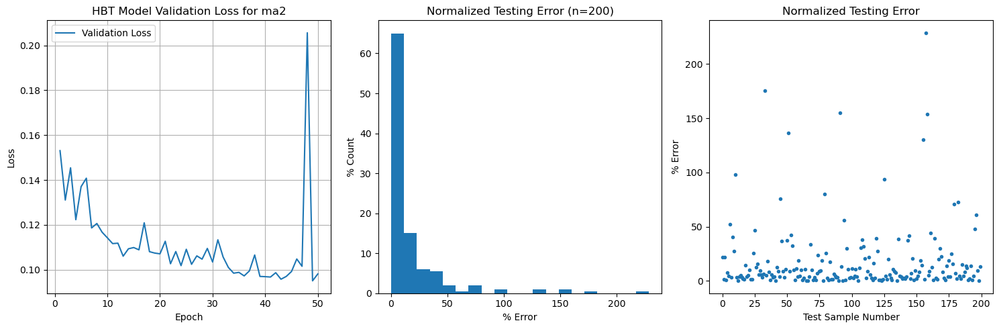

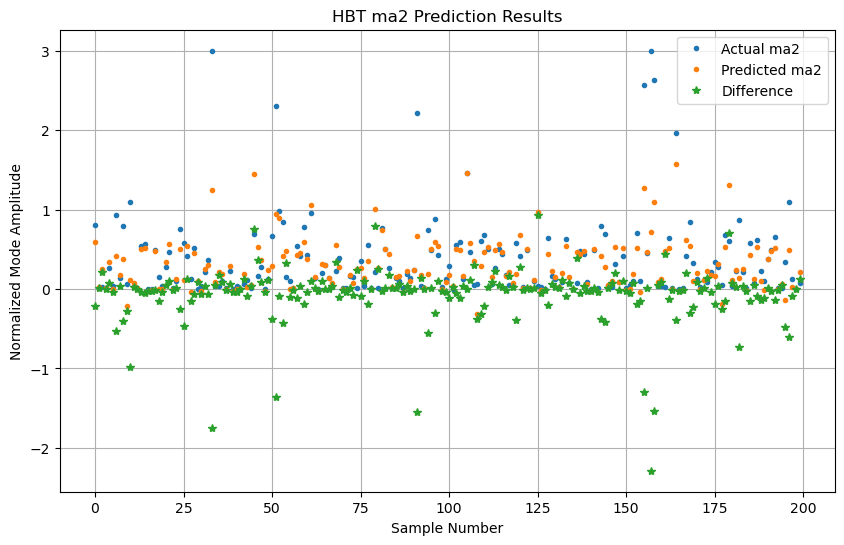

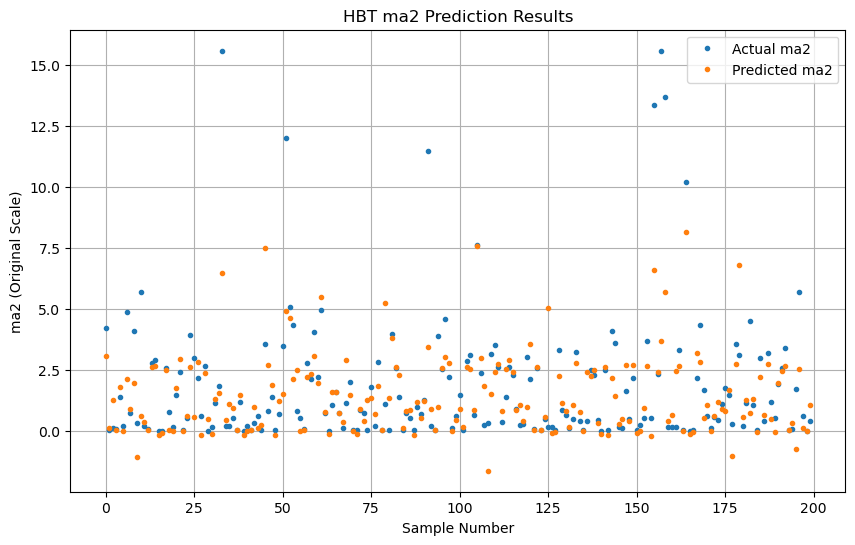

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.57
Mean absolute percentage error: 17.82%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

5.191251621246337
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


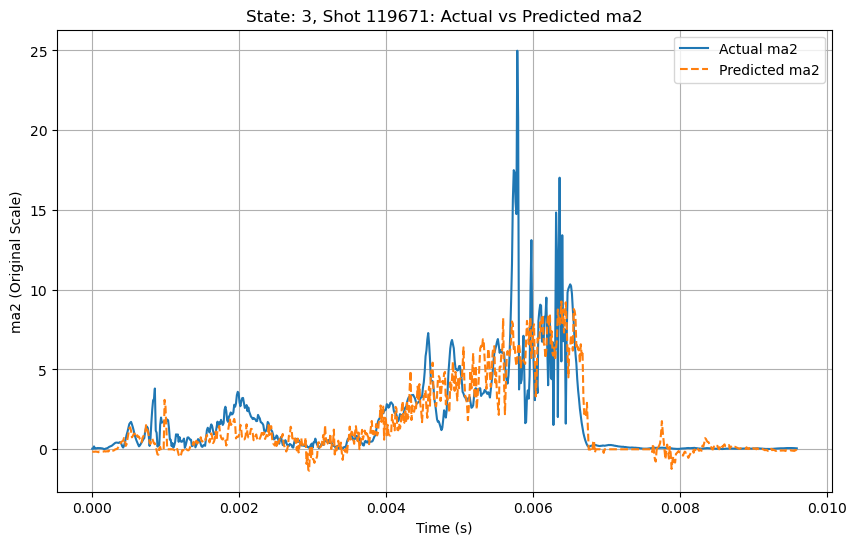

Shot 119671 - Mean absolute percentage error: 17.97%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 9.26


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
